### Lemay_AI section-3 (Exploratory data analysis)

In [1]:
!pip install datasets

### Step-1: <br>
#### Installing the required python packages for the project.<br>
- Loading the dataset from HuggingFace datasets.
- The dataset utilised for the project is 'App_review' from HuggingFace as mentioned in the instructions. 
- The reason for choosing this dataset is that, as an aspiring developer in AI/ML, it is necessary to analyse on the review for an application. It provides, additional information on user's interests, trends and pattern towards applications and technologies. 

#### Objective: <br> 
- To provide statistical summary on the ratings (mean) given to applications.
- To analyse diversified reviews and list the most common words, including uni-gram and bi-gram visualization. 
- To provide advanced visualizations of words in reviews using scattertext.

In [191]:
import re 
import numpy as np
import pandas as pd
import spacy as sp
import scattertext as st
from matplotlib import pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
from nltk import ngrams
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from datasets import load_dataset
from nltk.stem import PorterStemmer

stemmer = PorterStemmer()
nlp = sp.load("en_core_web_sm")
dataset = load_dataset("app_reviews")
type(dataset)

Using custom data configuration default
Found cached dataset app_reviews (C:/Users/Vivek/.cache/huggingface/datasets/app_reviews/default/0.0.0/20335b51b604b9bc04b7be253cd8445caa9ba93f15f39a4b0492b9e9102853de)


  0%|          | 0/1 [00:00<?, ?it/s]

datasets.dataset_dict.DatasetDict

In [2]:
class LemayAi:
    def __init__(self, data):
        self.train = data
        
    def load_df(self): #to output the dict_dataset as a pandas dataframe.
        self.train = pd.DataFrame.from_dict(self.train['train'], orient='columns')
        return self.train
    
    def infor(self): 
        train_info = self.train.info #information on columns in dataset including their dtype.
        descritpion = self.train.describe().T #statistics of 'star' column in the dataset.
        return train_info, descritpion
    
    def missing_values(self, args = ['train', 'test']): #to check for null/NaN values in  dataframe.
        if args == 'train':
            self.train.isnull().sum()
            print(self.train.isnull().sum())
            print('Missing values found - TRAIN DATA', '\n',self.train.isnull().sum())
            #self.train['keyword'].fillna(self.train['keyword'].mode()[0],inplace=True)
            #self.train['location'].fillna(self.train['location'].mode()[0],inplace=True)
            return self.train

In [3]:
section3 = LemayAi(dataset) #create an object
df1 = section3.load_df() 
df1['date']=pd.to_datetime(df1['date']) #convert to pandas datetime object

In [4]:
section3.missing_values(args='train')
#df1['package_name'] = section3.cleaning_text(df1,'package_name')

package_name    0
review          0
date            0
star            0
dtype: int64
Missing values found - TRAIN DATA 
 package_name    0
review          0
date            0
star            0
dtype: int64


,package_name,review,date,star
0,com.mantz_it.rfanalyzer,Great app! The new version now works on my Bra...,2016-10-12,4
1,com.mantz_it.rfanalyzer,Great It's not fully optimised and has some is...,2016-08-23,4
2,com.mantz_it.rfanalyzer,Works on a Nexus 6p I'm still messing around w...,2016-08-04,5
3,com.mantz_it.rfanalyzer,The bandwidth seemed to be limited to maximum ...,2016-07-25,3
4,com.mantz_it.rfanalyzer,Works well with my Hackrf Hopefully new update...,2016-07-22,5
...,...,...,...,...
288060,com.termux.api,it doesn't do anything after installing this i...,2016-06-24,3
288061,com.termux.api,I like this app . Its is very helpful for use....,2016-06-20,5
288062,com.termux.api,Finally Brings back the Unix command line to A...,2016-05-20,5
288063,com.termux.api,The API feature is great just need loads more...,2016-05-05,5


### Step - 2

#### Preprocessing - Data preparation and cleaning.
- Identifying the top 'package_name' from the dataset. *(top 3 is considered for analysis)*


In [5]:
df1['package_name'].value_counts() 

com.google.android.gms                103535
org.telegram.messenger                 22816
org.ppsspp.ppsspp                       9771
com.frostwire.android                   8867
com.google.android.marvin.talkback      7807
                                       ...  
com.github.grimpy.botifier                12
com.googlecode.gtalksms                   11
com.nathanosman.chronosnap                11
net.ralphbroenink.muzei.unsplash          11
com.xargsgrep.portknocker                 10
Name: package_name, Length: 395, dtype: int64

- Removing un-necessary characters from the name of the packages.
- Saving it in the same column *(inplace=True)* after performing the task.

In [6]:
new_google_records = df1[df1['package_name']== 'com.google.android.gms']
new_telegram_records = df1[df1['package_name']== 'org.telegram.messenger']
new_frostwire_records = df1[df1['package_name']== 'com.frostwire.android']
#df1['review'] = section3.cleaning_text(df1,'review')
#df1['date']=pd.to_datetime(df1['date'])
def remov(phrase):
    return phrase[-3:]
new_google_records['package_name'] = new_google_records['package_name'].apply(remov)
new_telegram_records['package_name'] = new_telegram_records['package_name'].apply(lambda x: x[-9:])
new_frostwire_records['package_name'] = new_frostwire_records['package_name'].apply(lambda x: x[4:13])

C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

#### Data cleaning - performed on top 3 app's reviews, listed in the above cells.
- Removing special characters.
- Applying lower-case.
- Removing stopwords

In [130]:
import string
# create function for punctuation removal:
def remove_punctuations(text):
    for char in string.punctuation:
        text = text.replace(char, '')
    return text

new_frostwire_records['review'] = new_frostwire_records['review'].str.lower()
new_frostwire_records['review'] = new_frostwire_records['review'].apply(remove_punctuations)
new_frostwire_records['review'] = new_frostwire_records['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in stopwords.words('english')]))
new_frostwire_records['review']=new_frostwire_records['review'].astype(str).apply(lambda x: x.encode('ascii', 'ignore').decode('ascii'))


new_telegram_records['review'] = new_telegram_records['review'].str.lower()
new_telegram_records['review'] = new_telegram_records['review'].apply(remove_punctuations)
new_telegram_records['review'] = new_telegram_records['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in stopwords.words('english')]))
new_telegram_records['review']=new_telegram_records['review'].astype(str).apply(lambda x: x.encode('ascii', 'ignore').decode('ascii'))

new_google_records['review'] = new_google_records['review'].str.lower()
new_google_records['review'] = new_google_records['review'].apply(remove_punctuations)
new_google_records['review'] = new_google_records['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in stopwords.words('english')]))
new_google_records['review']=new_google_records['review'].astype(str).apply(lambda x: x.encode('ascii', 'ignore').decode('ascii'))

C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':
C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: 

### Step - 3 
#### Visualizations: <br>
- Average ratings recorded on the top mobile applications per year.

Why is it required? <br>
- To identify potential trends in user's interest towards mobile applications. 
As far as this dataset is concerened, it is clear that, during the year 2016-2017, more number of users were interested in 
telegram-messenger.

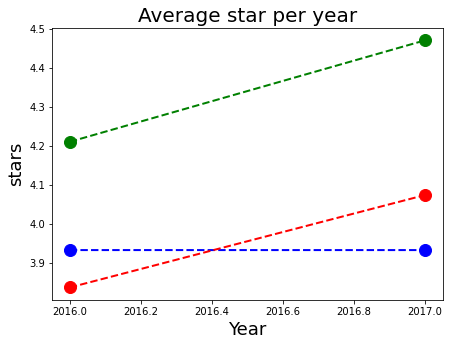

In [135]:
frostwire_year = new_frostwire_records.groupby(df1['date'].dt.year).mean()
telegram_year = new_telegram_records.groupby(df1['date'].dt.year).mean()
google_year = new_google_records.groupby(df1['date'].dt.year).mean()

#creating plots
plt.figure(figsize=(7,5))
plt.title('Average star per year', fontsize=20)
plt.plot(frostwire_year, marker='o', linestyle='dashed',
     linewidth=2, markersize=12, color = 'blue')
plt.plot(telegram_year, marker='o', linestyle='dashed',
     linewidth=2, markersize=12, color = 'green')
plt.plot(google_year, marker='o', linestyle='dashed',
     linewidth=2, markersize=12, color = 'red')
plt.xlabel('Year',  fontsize=18)
plt.ylabel('stars',  fontsize=18)
plt.gcf()
plt.savefig('AvgStars.png',dpi =600, transparent=True, facecolor = 'white')

#### Monthwise distribution of ratings and observations: <br>
- Upon visualization, it is clear that, 04-2016, for telegram-messenger has few outliers in the records, deviating from the mean. (Boxplot)


C:\Users\Vivek\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Vivek\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Vivek\anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


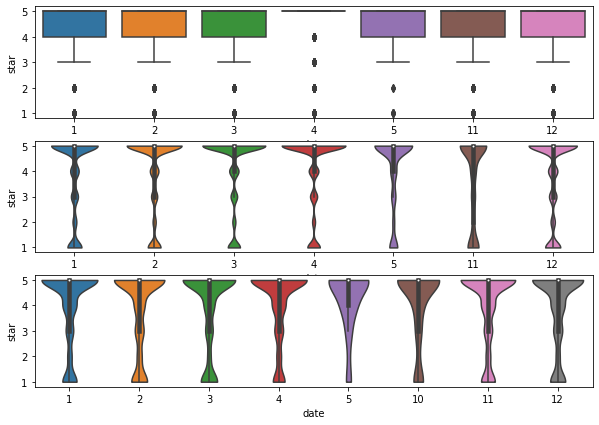

In [186]:
fig, axs = plt.subplots(nrows=3, figsize = (10,7))
sns.boxplot(new_telegram_records['date'].dt.month, new_telegram_records['star'],orient = 'v',ax=axs[0])
sns.violinplot(new_google_records['date'].dt.month, new_google_records['star'],orient = 'v', bw_adjust=2,cut=0 , ax = axs[1])
sns.violinplot(new_frostwire_records['date'].dt.month,new_frostwire_records['star'], orient = 'v', bw_adjust=2, cut=0 ,ax = axs[2])
plt.gcf()
plt.savefig('AvgStars.png',dpi =600, transparent=True, facecolor = 'white')

### Text Analysis - reviews
*(We have only considered the top mobile app - Google mobile services app and it's reviews for texts analysis)*

- As we could see the results of the cell below, that, the reivews for the GMS app is not cleaned. 
- Most frequent word without preprocessing (text-cleaning) is 'Nice'
-However, after cleaning, it is 'Superb'

In [157]:

data_analysis = nltk.FreqDist(new_google_records['review'])
# Let's take the specific words only if their frequency is greater than 3.
filter_words = dict([(m, n) for m, n in data_analysis.items() if len(m) > 3])
for key in sorted(filter_words):
    print('--------------------'*2)
    print("%s: %s" % (key, filter_words[key]))

----------------------------------------
         : 1
----------------------------------------
                                                            mohammadtalai                                                : 2
----------------------------------------
                           b: 1
----------------------------------------
                clash royal: 1
----------------------------------------
                tanku google: 1
----------------------------------------
             arminesi   huawei g700: 1
----------------------------------------
             like: 1
----------------------------------------
             playstore  hangout  youtube: 1
----------------------------------------
             xxx: 1
----------------------------------------
            hhh: 1
----------------------------------------
          sedaibaran50  : 1
----------------------------------------
         gts7272   : 1
----------------------------------------
         maryam: 1
---------------------

----------------------------------------
add popups apps: 1
----------------------------------------
add watch later: 1
----------------------------------------
addaek: 2
----------------------------------------
addective helps everyone: 1
----------------------------------------
addicated game: 1
----------------------------------------
addict many often directed make votes casting couch: 1
----------------------------------------
addicted consume time: 1
----------------------------------------
addictive: 2
----------------------------------------
addictive fun: 1
----------------------------------------
addictive good app addictive: 1
----------------------------------------
addictive gosh favourite game: 1
----------------------------------------
addie good: 1
----------------------------------------
addipolli: 1
----------------------------------------
additional services enjoy: 1
----------------------------------------
addresses needs satisfaction guarantees services delivered s

----------------------------------------
amaizing: 1
----------------------------------------
amaizing fix download glitches: 1
----------------------------------------
amaizing mad: 1
----------------------------------------
amaizing super: 1
----------------------------------------
amaizingfuntastic: 1
----------------------------------------
amal axmad: 1
----------------------------------------
amal debbarma: 1
----------------------------------------
amal nemikone amalnwmikone: 1
----------------------------------------
amalia: 1
----------------------------------------
aman: 6
----------------------------------------
aman app important: 1
----------------------------------------
aman chaudhary better: 1
----------------------------------------
aman cool: 1
----------------------------------------
aman good appi download game directly app: 1
----------------------------------------
aman gupta 7222: 1
----------------------------------------
aman important update: 1
---------------

----------------------------------------
app best game: 1
----------------------------------------
app best good: 1
----------------------------------------
app best type apps love still also safty phone: 1
----------------------------------------
app best want app best decision would google play: 1
----------------------------------------
app bestest app love helpfull: 1
----------------------------------------
app better app: 1
----------------------------------------
app better beforeeverytime see notification offailed sign ineven put correct email id signing inpreviously none problemplease fix: 1
----------------------------------------
app big upto 43mega bytes: 1
----------------------------------------
app biggie phone 32gb laggs little: 1
----------------------------------------
app bor app: 1
----------------------------------------
app boring: 1
----------------------------------------
app boring beacause update app still working: 1
----------------------------------------
ap

----------------------------------------
asha fine: 1
----------------------------------------
asha gupta: 1
----------------------------------------
asha pk ok: 1
----------------------------------------
asha saleh: 1
----------------------------------------
asha singh: 1
----------------------------------------
asha tamang: 1
----------------------------------------
ashab: 1
----------------------------------------
ashamed good: 1
----------------------------------------
ashan alam: 1
----------------------------------------
ashanti: 1
----------------------------------------
asheesh asheesh: 1
----------------------------------------
ashegh: 1
----------------------------------------
asher india pvt ltd excellent: 1
----------------------------------------
ashfaq nadeem: 1
----------------------------------------
ashik: 2
----------------------------------------
ashik nerob: 1
----------------------------------------
ashiri aye epic movie: 1
----------------------------------------


----------------------------------------
ayos nice: 1
----------------------------------------
ayos public: 1
----------------------------------------
ayou ojua solange love: 1
----------------------------------------
ayoub: 1
----------------------------------------
ayoub fz grasia: 1
----------------------------------------
ayshikfnagoogleplarservuices: 1
----------------------------------------
aysorm like: 1
----------------------------------------
ayt dont see changes works: 1
----------------------------------------
aytunc altindali dinlemek: 1
----------------------------------------
ayub sehkh: 1
----------------------------------------
ayubk ayubkhan: 1
----------------------------------------
ayus: 1
----------------------------------------
ayus mabilis: 1
----------------------------------------
ayush: 1
----------------------------------------
ayush chaurasia: 1
----------------------------------------
ayush rock apk: 1
----------------------------------------
aywam haldera

bapu: 1
----------------------------------------
bapun: 1
----------------------------------------
baqar: 1
----------------------------------------
baqwaaas kya fazool banaya hai youtube nhi chalega bagair google play servicesnhi karna hai update toh bhi update update: 1
----------------------------------------
baqwas app hoti hi nahi bhot dair ka kr rha hon ap isay khabi bhey downlod na karna waste time: 1
----------------------------------------
baqwas cant work correctly: 1
----------------------------------------
baqwas hoti hi nahi bhot dair ka kr rha hon ap isay khabi bhey downlod na karna waste time: 1
----------------------------------------
bar bar update dite hoy: 1
----------------------------------------
bar bar update hone wala system koi jara ise hataye pura bakwaas baar baar update krna padta: 1
----------------------------------------
bar bar update kitni bar update karoge silo net proses: 1
----------------------------------------
bar bar uptad nhi chalga teri maka bh

best kind: 3
----------------------------------------
best lang tayo: 1
----------------------------------------
best latest version using android 6 cant say word google play service simply awesome well protected designed best developers google wish would get effective interface upper version efficient developers technology world: 1
----------------------------------------
best life: 1
----------------------------------------
best like: 10
----------------------------------------
best like much: 1
----------------------------------------
best like said best: 1
----------------------------------------
best like wlo: 1
----------------------------------------
best link apps: 1
----------------------------------------
best long drive: 1
----------------------------------------
best love: 11
----------------------------------------
best love app: 2
----------------------------------------
best love google play: 1
----------------------------------------
best love service keep updating: 1
-

----------------------------------------
boooo boooo: 1
----------------------------------------
boooo hate: 1
----------------------------------------
boooom lol still dont option move sd card: 1
----------------------------------------
booooom: 1
----------------------------------------
booooooom: 1
----------------------------------------
boooooooo shiteeee: 1
----------------------------------------
booooooooo hate booooooooo: 1
----------------------------------------
booooooooooo: 2
----------------------------------------
booooooooooooo      : 1
----------------------------------------
boooooooooooooo: 1
----------------------------------------
booooooooooooooooooooooooooooring: 1
----------------------------------------
booooooooooring: 1
----------------------------------------
booooooring: 2
----------------------------------------
boooooring: 1
----------------------------------------
booooring: 1
----------------------------------------
boooorrrriiiinnnngggg: 1
------------

cant update it: 1
----------------------------------------
cant update itkeep error: 1
----------------------------------------
cant update ive downloaded sveral times yet cant installed: 1
----------------------------------------
cant update junk : 1
----------------------------------------
cant update juz wasting tym: 1
----------------------------------------
cant update keeps coming cant install app would happen: 1
----------------------------------------
cant update keeps sending stupid reminders update: 1
----------------------------------------
cant update like users something google: 1
----------------------------------------
cant update loading: 1
----------------------------------------
cant update lol keeps telling error code 506 already tried troubleshooting use: 1
----------------------------------------
cant update looks like im network even using 4g still updating cant play services bad service: 1
----------------------------------------
cant update matter many times tri

----------------------------------------
consume large space takes lot space around 115mb phones internal storage please something thank: 1
----------------------------------------
consume large storage takes alot space: 1
----------------------------------------
consume lost memory mobile kindly need full: 1
----------------------------------------
consume lot f phone memory: 1
----------------------------------------
consume lot memory: 1
----------------------------------------
consume lot memory app much cant move sd card: 1
----------------------------------------
consume lot memory kindly reduce storage memory usage: 1
----------------------------------------
consume lot memory make lite powerful: 1
----------------------------------------
consume lot memory processor consume lot memory processor gets installed without asking even auto update: 1
----------------------------------------
consume lots memoryi hope resolve itas soon possibleit lots permissions use whatever want usei 

----------------------------------------
darn need update first play favorite game sucks almost biggest app phone: 1
----------------------------------------
darn uses memory lls fix: 1
----------------------------------------
daro daro: 1
----------------------------------------
darrell ball another great app: 1
----------------------------------------
darren: 1
----------------------------------------
darshan: 1
----------------------------------------
darshan gurjar: 1
----------------------------------------
darshan poor: 1
----------------------------------------
darty download bad process application: 1
----------------------------------------
darun: 2
----------------------------------------
darwen aquino 12345: 1
----------------------------------------
das 123456: 1
----------------------------------------
das allot: 1
----------------------------------------
das good: 2
----------------------------------------
das loved: 1
----------------------------------------
das maya: 1


dolker: 1
----------------------------------------
dolly good appexcellent service: 1
----------------------------------------
dolly yes ok: 1
----------------------------------------
dolphin fish: 1
----------------------------------------
dom colinrs: 1
----------------------------------------
dome wont load u guys something: 1
----------------------------------------
dominate bombard: 1
----------------------------------------
dominoe block puzzle: 1
----------------------------------------
donald: 1
----------------------------------------
donald e brown donald e brown: 1
----------------------------------------
donald majola: 1
----------------------------------------
done: 7
----------------------------------------
done everything possible rectify still pops google play services wont run unless update pleasepleasefix: 1
----------------------------------------
done super app: 1
----------------------------------------
done updating says install ing takes long install: 1
---------

easy app: 2
----------------------------------------
easy app easy: 1
----------------------------------------
easy app easy use: 1
----------------------------------------
easy app sgore way better: 2
----------------------------------------
easy app simple like apps super complex even know settings: 1
----------------------------------------
easy app use: 1
----------------------------------------
easy approach: 1
----------------------------------------
easy apps: 1
----------------------------------------
easy browse: 1
----------------------------------------
easy catch anything: 1
----------------------------------------
easy communicatio: 1
----------------------------------------
easy convenient saves time: 1
----------------------------------------
easy conviet: 1
----------------------------------------
easy cool: 1
----------------------------------------
easy dont know people think hard install look stuff easy: 1
----------------------------------------
easy dowload apps: 1

----------------------------------------
every time upgrade n upgrade till phone n sd card memory gets fullwhy cant simple: 1
----------------------------------------
every time usefull nice: 1
----------------------------------------
every time want search tells update new version many new versions going update every time: 1
----------------------------------------
every time wanted update: 1
----------------------------------------
every times show praising problem: 1
----------------------------------------
every two days update done time phone major connectivity problems shouldnt slave google play updates lose half phones factions: 1
----------------------------------------
everyday: 1
----------------------------------------
everyday must update damn: 1
----------------------------------------
everyday tool useful many reasons : 1
----------------------------------------
everyday updates: 1
----------------------------------------
everyone download app: 1
-------------------------

faster best: 1
----------------------------------------
faster better: 2
----------------------------------------
faster better app: 1
----------------------------------------
faster better approach internet: 1
----------------------------------------
faster cool: 1
----------------------------------------
faster data: 1
----------------------------------------
faster douwnload: 1
----------------------------------------
faster download: 2
----------------------------------------
faster drive faster use: 1
----------------------------------------
faster easier: 1
----------------------------------------
faster ever: 1
----------------------------------------
faster gaming: 2
----------------------------------------
faster helpful: 1
----------------------------------------
faster ia verry nace app: 1
----------------------------------------
faster least: 1
----------------------------------------
faster like love: 1
----------------------------------------
faster nice: 1
--------------

funny game: 2
----------------------------------------
funny got lot funny pics: 1
----------------------------------------
funny mast: 1
----------------------------------------
funtastick awesome: 1
----------------------------------------
fuqin bloatware title says: 1
----------------------------------------
furqan best cool: 1
----------------------------------------
furtado good: 1
----------------------------------------
fussssss: 1
----------------------------------------
future: 1
----------------------------------------
future caming: 5
----------------------------------------
future crazy love ko ko love: 1
----------------------------------------
future looks bright: 1
----------------------------------------
future nice: 1
----------------------------------------
future nurse humble god feeling: 1
----------------------------------------
future would like share inspiration life: 1
----------------------------------------
fuu nervebs mishlis: 1
------------------------------

----------------------------------------
goggle user nice application: 1
----------------------------------------
goggleplay like: 1
----------------------------------------
goggles goggles: 1
----------------------------------------
goggles services: 1
----------------------------------------
gogh vhf vhf cbgb see lot way bit sure sure questions lot use use saw f: 1
----------------------------------------
gogle : 1
----------------------------------------
gogle accaunt gogle accaunt: 1
----------------------------------------
gogle fast: 1
----------------------------------------
gogle file: 1
----------------------------------------
gogle good: 1
----------------------------------------
gogle play: 1
----------------------------------------
gogle play fg: 1
----------------------------------------
gogle play gogle email: 1
----------------------------------------
gogle play good: 1
----------------------------------------
gogle play new version: 1
-----------------------------------

good fansy: 1
----------------------------------------
good fantastic: 7
----------------------------------------
good fantastic job: 1
----------------------------------------
good fantasy: 1
----------------------------------------
good far: 3
----------------------------------------
good far everything running smoothly: 1
----------------------------------------
good far love: 1
----------------------------------------
good farst: 1
----------------------------------------
good fast: 10
----------------------------------------
good fast downloading: 1
----------------------------------------
good fast google related app: 1
----------------------------------------
good fast long longer lasting: 1
----------------------------------------
good fast techno w4 good service: 1
----------------------------------------
good fast working: 1
----------------------------------------
good father apps: 1
----------------------------------------
good fc: 1
----------------------------------------

----------------------------------------
good service best a1: 1
----------------------------------------
good service best fast good version: 1
----------------------------------------
good service cyaa stop using dis: 1
----------------------------------------
good service drains battery fast like: 1
----------------------------------------
good service easy best: 1
----------------------------------------
good service easy use changes come without warning leading mild confusion: 1
----------------------------------------
good service easy use helpfull: 1
----------------------------------------
good service excellent: 2
----------------------------------------
good service excilent: 1
----------------------------------------
good service following user name good best way functiongood service: 1
----------------------------------------
good service games: 1
----------------------------------------
good service good: 4
----------------------------------------
good service good job: 1


google ok: 4
----------------------------------------
google ok bad: 1
----------------------------------------
google okey: 1
----------------------------------------
google old vesion: 1
----------------------------------------
google one hold nice learn lot: 1
----------------------------------------
google one survive day: 1
----------------------------------------
google open: 1
----------------------------------------
google p hi: 1
----------------------------------------
google p mandatory app: 1
----------------------------------------
google p ok: 1
----------------------------------------
google p soomthm: 1
----------------------------------------
google page keeps popping: 1
----------------------------------------
google paly: 1
----------------------------------------
google paly google: 1
----------------------------------------
google paly servc dacay: 1
----------------------------------------
google paly service stopped working plz help fix: 1
-----------------------

----------------------------------------
google played ive: 1
----------------------------------------
google player: 2
----------------------------------------
google player editing photo: 1
----------------------------------------
google player ok: 1
----------------------------------------
google player services really good: 1
----------------------------------------
google playr: 1
----------------------------------------
google plays: 1
----------------------------------------
google playservice nice: 1
----------------------------------------
google playservices: 1
----------------------------------------
google playservices good services: 1
----------------------------------------
google playstor: 1
----------------------------------------
google playstor love: 1
----------------------------------------
google playstore: 2
----------------------------------------
google playstore amazing app buy amazing app: 2
----------------------------------------
google playstore apps: 1
---

great helps find anything need want: 1
----------------------------------------
great helps talk people faster: 1
----------------------------------------
great helps watch favorite song movies etc big mb worth: 1
----------------------------------------
great helps watch youtube amazing entertaining apps: 1
----------------------------------------
great here: 1
----------------------------------------
great heres lookin xhu kidd: 1
----------------------------------------
great high: 1
----------------------------------------
great hj: 1
----------------------------------------
great honest: 1
----------------------------------------
great hot: 1
----------------------------------------
great hurry downloading: 1
----------------------------------------
great idea: 1
----------------------------------------
great idea keeps data safety love google keep: 1
----------------------------------------
great idea need fast updating apps ok: 1
----------------------------------------
great id

hard set: 1
----------------------------------------
hard sire: 1
----------------------------------------
hard thisahhhhhh: 1
----------------------------------------
hard time getting stuff go ok: 1
----------------------------------------
hard update: 5
----------------------------------------
hard update acc hard update acc game thats realy anoying: 1
----------------------------------------
hard update cant really update really well good app needs faster simpler updates: 1
----------------------------------------
hard update god: 1
----------------------------------------
hard update hard update always error: 1
----------------------------------------
hard update useless app: 1
----------------------------------------
hard updatei hate app: 1
----------------------------------------
hard use: 1
----------------------------------------
hard whenever want update like waiting network: 1
----------------------------------------
hard work: 1
----------------------------------------
har

help us work: 1
----------------------------------------
help use tube: 1
----------------------------------------
help used google app: 1
----------------------------------------
help utube: 1
----------------------------------------
help want use updet app: 1
----------------------------------------
help wont update: 1
----------------------------------------
help working: 1
----------------------------------------
helped: 1
----------------------------------------
helped alot: 2
----------------------------------------
helped get snapchat: 1
----------------------------------------
helped helped get data: 1
----------------------------------------
helped log soundcloud account havent able use months: 1
----------------------------------------
helped lolololololol: 1
----------------------------------------
helped lot accessing new apps: 1
----------------------------------------
helped lot k much: 1
----------------------------------------
helped lot learning new things: 1
---------

honey mass: 1
----------------------------------------
honeymaepanay: 1
----------------------------------------
honnukajji: 1
----------------------------------------
honor 5x: 1
----------------------------------------
hoo iam happy u friends: 1
----------------------------------------
hood: 1
----------------------------------------
hoodoo jhakass: 1
----------------------------------------
hoog ram: 1
----------------------------------------
hook: 1
----------------------------------------
hook deskarapiton: 1
----------------------------------------
hooman   : 1
----------------------------------------
hooo hooo: 1
----------------------------------------
hooo need place mobile: 1
----------------------------------------
hooo wow wow: 1
----------------------------------------
hoooo 1: 1
----------------------------------------
hoooo hooo: 1
----------------------------------------
hooooo hooooooo: 1
----------------------------------------
hoooooo: 1
-----------------------------

----------------------------------------
importante imports thing clash clans importante: 1
----------------------------------------
importante impressive: 1
----------------------------------------
importantly: 1
----------------------------------------
importants important aaps like also backup great: 1
----------------------------------------
imported dont working dont know: 1
----------------------------------------
importent: 2
----------------------------------------
importent app: 1
----------------------------------------
importent every thing: 1
----------------------------------------
impossible navigate novice: 1
----------------------------------------
impossible update: 1
----------------------------------------
impossible update even jio sim: 1
----------------------------------------
impotant android: 1
----------------------------------------
impotence evry game software every one downlod apps lost max clash clans id every one becarefull caneated game play dont forget: 

jatinchandrasahu: 1
----------------------------------------
jatt: 2
----------------------------------------
jatt die yari: 1
----------------------------------------
jatta jainaba jatta: 1
----------------------------------------
jatti nachdi patola banke punjabi song: 1
----------------------------------------
jault: 1
----------------------------------------
jauu: 1
----------------------------------------
java key thank mr john hunt alex mcq manus book key java iam thonee used read book key java book: 1
----------------------------------------
javad : 1
----------------------------------------
javad haqani khub: 1
----------------------------------------
javad nahali: 1
----------------------------------------
javadd zayn malik: 1
----------------------------------------
javed jave: 1
----------------------------------------
javed king: 1
----------------------------------------
javed mohammad ipl live cricket: 2
----------------------------------------
javiergarcia321 ja: 1
-----

----------------------------------------
keep crushing infinixx551: 1
----------------------------------------
keep data midern time: 1
----------------------------------------
keep force closing fon: 1
----------------------------------------
keep games: 1
----------------------------------------
keep get annoying notification stop: 1
----------------------------------------
keep getting annoying notification: 1
----------------------------------------
keep getting error message annoying new trick: 1
----------------------------------------
keep getting google play services keeps stopping error stop cant get typing one word without popping im getting angry ive never problem usually google works great today pissing please fix: 1
----------------------------------------
keep getting message saying keeps stopping needs fixed asap: 1
----------------------------------------
keep getting notification: 1
----------------------------------------
keep getting responding error dont know downlo

kwame guru: 1
----------------------------------------
kwena lekoala: 1
----------------------------------------
kya bolu kya kahu: 1
----------------------------------------
kya chutiyapa hai ye: 1
----------------------------------------
kya chutyagiri hai yr ye update karo nahi wo app nhi chalega bas karo yar ab jio ka speed bhi kam hogaya hai: 1
----------------------------------------
kya hai yeh: 1
----------------------------------------
kya kar happy birthday: 1
----------------------------------------
kya likhu: 1
----------------------------------------
kyamudin ali kyamudinali 52gemilcom: 1
----------------------------------------
kyaw: 1
----------------------------------------
kyaw 7777: 1
----------------------------------------
kyaw2016nor: 1
----------------------------------------
kyawgyi: 1
----------------------------------------
kyawzinoo: 1
----------------------------------------
kyawzya yz: 1
----------------------------------------
kyo update mangti h baar baar:

like itt: 3
----------------------------------------
like itthank: 1
----------------------------------------
like iy want symphony w22 phone: 1
----------------------------------------
like jackiekumar: 1
----------------------------------------
like jessica: 1
----------------------------------------
like jesus: 1
----------------------------------------
like keep stuff: 1
----------------------------------------
like keeps updated every time: 1
----------------------------------------
like ketchup yes: 1
----------------------------------------
like kg: 1
----------------------------------------
like kit app happy new balance: 1
----------------------------------------
like know: 1
----------------------------------------
like kol thanks: 1
----------------------------------------
like kuldeep singh: 1
----------------------------------------
like lets play games dope awesome: 1
----------------------------------------
like li: 1
----------------------------------------
like like: 5

----------------------------------------
love always: 3
----------------------------------------
love always assist time: 1
----------------------------------------
love always excellent: 1
----------------------------------------
love always loving: 1
----------------------------------------
love always time: 1
----------------------------------------
love amazing: 12
----------------------------------------
love amazing cool: 1
----------------------------------------
love amir: 1
----------------------------------------
love amit: 1
----------------------------------------
love android: 2
----------------------------------------
love android anything want google work hard deliver content features guys take wonderful step forward expand: 1
----------------------------------------
love android thee bst ph gaming: 1
----------------------------------------
love anything: 2
----------------------------------------
love anything ever delete games: 1
--------------------------------------

----------------------------------------
love true love: 1
----------------------------------------
love true story: 1
----------------------------------------
love trust issues: 1
----------------------------------------
love tube: 1
----------------------------------------
love tubitv: 1
----------------------------------------
love tumi: 1
----------------------------------------
love ty: 1
----------------------------------------
love u: 27
----------------------------------------
love u amma: 1
----------------------------------------
love u ankit gupta: 1
----------------------------------------
love u basu: 1
----------------------------------------
love u beautiful: 1
----------------------------------------
love u best: 1
----------------------------------------
love u dont games arent gonna work: 1
----------------------------------------
love u excellent: 1
----------------------------------------
love u find anything im looking app easy use: 1
------------------------------

----------------------------------------
mahesh bhai okay: 1
----------------------------------------
mahesh dhakad google: 1
----------------------------------------
mahesh great app: 1
----------------------------------------
mahesh kaurav: 1
----------------------------------------
mahesh kumar sharma: 1
----------------------------------------
mahesh makvana: 1
----------------------------------------
mahesh ram: 1
----------------------------------------
mahesh solanki: 1
----------------------------------------
mahesh tanwar: 1
----------------------------------------
mahesh thakor: 2
----------------------------------------
mahesh yadav dodla: 1
----------------------------------------
maheshji: 1
----------------------------------------
mahfooj khan: 1
----------------------------------------
mahfuj hossain nice alps sign sweet apps: 1
----------------------------------------
mahi: 1
----------------------------------------
mahi magi: 1
----------------------------------------


may problematic users love stay blessed google: 1
----------------------------------------
may wakelocks kills battery life phone makes great phone run like rubbish sort google new versions havent improved: 1
----------------------------------------
may works: 1
----------------------------------------
maya: 1
----------------------------------------
maya marak: 1
----------------------------------------
maya sasngkhar: 1
----------------------------------------
mayadharamajhi: 1
----------------------------------------
mayank: 2
----------------------------------------
mayanksallam v nice: 1
----------------------------------------
mayanmar: 1
----------------------------------------
mayashee hi iam mayashee: 1
----------------------------------------
maybe good: 1
----------------------------------------
maybe good would great doesnt consume lot memory sometimes keeps crashing cleared space took: 1
----------------------------------------
maychirel hahah: 1
--------------------------

mohsan mohsan: 1
----------------------------------------
mohsen rahmati: 1
----------------------------------------
mohsin: 1
----------------------------------------
mohsin junejo: 1
----------------------------------------
mohsin khatri: 1
----------------------------------------
moidukkal mushthafa: 1
----------------------------------------
moin: 1
----------------------------------------
moin khan: 1
----------------------------------------
moine moine: 1
----------------------------------------
moinuddinmolla: 1
----------------------------------------
moinul islam: 1
----------------------------------------
moiz pagal app: 1
----------------------------------------
moj : 1
----------------------------------------
moja: 1
----------------------------------------
mojalefa malefeke: 1
----------------------------------------
mojamme khan: 1
----------------------------------------
mojirhossian mojirhossian: 1
----------------------------------------
moka: 1
-----------------------

muzammil nice: 1
----------------------------------------
mv sun: 1
----------------------------------------
mvinoth kumar: 1
----------------------------------------
mwanajumbe salimu mm: 1
----------------------------------------
mwangi: 1
----------------------------------------
mwangi 3391: 1
----------------------------------------
mwari makanaka: 1
----------------------------------------
mwebale mu: 1
----------------------------------------
mwinjuma athumam: 1
----------------------------------------
mx player hi: 1
----------------------------------------
mxondo: 1
----------------------------------------
mxxm hate app: 1
----------------------------------------
my1978487: 1
----------------------------------------
myanmar good: 1
----------------------------------------
myanmar myanmar: 1
----------------------------------------
myanmar ok: 1
----------------------------------------
myatmin myanmar: 1
----------------------------------------
mychwais 1234: 1
-----------------

new doesnt work hmmm: 1
----------------------------------------
new easy use: 1
----------------------------------------
new features: 1
----------------------------------------
new first time dont know: 1
----------------------------------------
new function see support useless waste time disconnet clash clan accountbeep beep beep p: 1
----------------------------------------
new game update: 1
----------------------------------------
new games: 1
----------------------------------------
new good: 2
----------------------------------------
new google play services new2017: 1
----------------------------------------
new h: 1
----------------------------------------
new handset user advertised aimed less: 1
----------------------------------------
new hell: 1
----------------------------------------
new know: 1
----------------------------------------
new latest: 1
----------------------------------------
new level upgrade hella dope: 1
----------------------------------------
new litt

----------------------------------------
nice one good: 2
----------------------------------------
nice one good app: 1
----------------------------------------
nice one good app star low: 1
----------------------------------------
nice one good one: 1
----------------------------------------
nice one good use: 1
----------------------------------------
nice one google loved: 2
----------------------------------------
nice one great: 2
----------------------------------------
nice one like: 3
----------------------------------------
nice one lovely: 1
----------------------------------------
nice one nice: 2
----------------------------------------
nice one nyce one: 1
----------------------------------------
nice one others: 1
----------------------------------------
nice one provides better service good android: 1
----------------------------------------
nice one really love google play services: 1
----------------------------------------
nice one since ihad finish allan problem enjo

----------------------------------------
nyc cool cool: 1
----------------------------------------
nyc cooooool: 1
----------------------------------------
nyc enjoyable: 1
----------------------------------------
nyc excellent: 1
----------------------------------------
nyc excellent app: 1
----------------------------------------
nyc exilent: 1
----------------------------------------
nyc fast technology: 1
----------------------------------------
nyc good: 5
----------------------------------------
nyc good needed every application open: 1
----------------------------------------
nyc google: 1
----------------------------------------
nyc gud: 2
----------------------------------------
nyc h: 1
----------------------------------------
nyc hot app: 1
----------------------------------------
nyc nazim: 1
----------------------------------------
nyc nice: 1
----------------------------------------
nyc nothing: 1
----------------------------------------
nyc nyc: 7
-----------------------

one googles helpful apps really made gadget work good youre a1 google: 1
----------------------------------------
one gooooooood: 1
----------------------------------------
one greatest: 1
----------------------------------------
one greatest apps ever: 1
----------------------------------------
one important thing phone: 1
----------------------------------------
one ist nyc: 1
----------------------------------------
one kind awesome: 1
----------------------------------------
one king nice app rated 5: 1
----------------------------------------
one like surely: 1
----------------------------------------
one like working importance needy smart cellfoneusers: 1
----------------------------------------
one lm earth l  emekasunju l generated profile one sites earth l successive one sites earth l legitimately owner sites earth lm lm good well ever sites earth l emekasunju ltgtltgt sincerity: 1
----------------------------------------
one love one life: 1
---------------------------------

picka arese: 1
----------------------------------------
picked problems create virus: 1
----------------------------------------
pickup windshield: 1
----------------------------------------
picnic: 1
----------------------------------------
pics: 1
----------------------------------------
pictures family friends: 1
----------------------------------------
pictures future: 1
----------------------------------------
pictures greatest: 1
----------------------------------------
piece: 1
----------------------------------------
piece consuming storages: 1
----------------------------------------
piece crap: 1
----------------------------------------
piece crap app crashes ever day boot factory reset apps use chrome gmail youtube sick crap seriously dont believe anyone google cares end give: 1
----------------------------------------
piece crap app doesnt sense use bandwidth mobile data connection turned mobile data check email 180kb 005 stinking google play hogs 18 megabytes 400 ate every

----------------------------------------
ppppp ppppp: 1
----------------------------------------
pppppl nice app: 1
----------------------------------------
pppppp nnnnn: 1
----------------------------------------
pppppppaaaappp aapswaaapanot: 1
----------------------------------------
pr missra: 1
----------------------------------------
pra tap palai: 1
----------------------------------------
prabakaran priya: 1
----------------------------------------
prabal: 1
----------------------------------------
prabas emeg: 1
----------------------------------------
prabesh love app much: 1
----------------------------------------
prabesh time give problem: 1
----------------------------------------
prabhakar nice: 1
----------------------------------------
prabhas fan: 1
----------------------------------------
prabhasdone hi mome: 1
----------------------------------------
prabhat kumar: 1
----------------------------------------
prabhat mahant: 1
----------------------------------------
p

----------------------------------------
raju ahmed: 3
----------------------------------------
raju beniwal: 1
----------------------------------------
raju borman: 1
----------------------------------------
raju dae566: 1
----------------------------------------
raju das helpfulashok: 1
----------------------------------------
raju dhonsi: 1
----------------------------------------
raju dj sound: 1
----------------------------------------
raju donda raju donda: 1
----------------------------------------
raju good: 1
----------------------------------------
raju good app: 1
----------------------------------------
raju goyari: 1
----------------------------------------
raju guys best one app: 1
----------------------------------------
raju k: 1
----------------------------------------
raju khan: 3
----------------------------------------
raju kumar: 1
----------------------------------------
raju kumar raju kumar: 1
----------------------------------------
raju narnaware raju narnawar

----------------------------------------
regina masasi: 1
----------------------------------------
regina whatsapp: 1
----------------------------------------
regine perto: 2
----------------------------------------
regis trading manager manager: 1
----------------------------------------
regular hisham: 1
----------------------------------------
rehahasan: 1
----------------------------------------
rehan akhtar: 1
----------------------------------------
rehan ansari: 1
----------------------------------------
rehan love: 1
----------------------------------------
rehan rb: 1
----------------------------------------
rehan rehan: 1
----------------------------------------
rehankhan: 1
----------------------------------------
rehas nipahoy: 1
----------------------------------------
rehman: 1
----------------------------------------
rehman khan: 1
----------------------------------------
reilly dont know sorry: 1
----------------------------------------
reinstall bcuz ml keep getting pr

saha nice: 1
----------------------------------------
saha pytm: 1
----------------------------------------
sahal: 2
----------------------------------------
sahalam: 1
----------------------------------------
sahana game: 2
----------------------------------------
sahani important things: 1
----------------------------------------
sahani sahani: 1
----------------------------------------
sahanur hossain dont love: 1
----------------------------------------
sahar gul sahar gul: 1
----------------------------------------
sahebuddin: 1
----------------------------------------
sahed: 1
----------------------------------------
sahel anwari: 1
----------------------------------------
sahel dont like run time updates: 1
----------------------------------------
saher saher: 1
----------------------------------------
sahfannah sahfnnah: 1
----------------------------------------
sahi: 1
----------------------------------------
sahi hai: 4
----------------------------------------
sahib good: 1


----------------------------------------
service good like: 1
----------------------------------------
service good slow: 1
----------------------------------------
service good sometimes slow upgrade app phone: 1
----------------------------------------
service good thats im say right: 1
----------------------------------------
service great: 2
----------------------------------------
service help full mb big make mb law: 1
----------------------------------------
service like: 1
----------------------------------------
service man jouend 1998 years: 1
----------------------------------------
service messager: 1
----------------------------------------
service nic service: 1
----------------------------------------
service nice: 2
----------------------------------------
service run google apps smoothly based good: 1
----------------------------------------
service service need update u must update: 1
----------------------------------------
service setting: 1
------------------------

sknayeemkhan: 1
----------------------------------------
skp nice: 1
----------------------------------------
skrappy chupuar: 1
----------------------------------------
sksanaulla: 1
----------------------------------------
skstskfs giz: 1
----------------------------------------
skylanders battlecast: 1
----------------------------------------
skymay012 gmail con cool: 1
----------------------------------------
skype: 1
----------------------------------------
skype skype: 1
----------------------------------------
slalu butuh ini: 1
----------------------------------------
slalu insuf mem pdhl sdh delete byk applic: 1
----------------------------------------
slam awesome: 1
----------------------------------------
slamdank google: 1
----------------------------------------
slee like many verite apps: 1
----------------------------------------
sleem rozzey: 1
----------------------------------------
slendri: 1
----------------------------------------
slim better: 1
------------------

started issues last update stupid floating adds interfere using apps unhappy: 1
----------------------------------------
started using already loving: 1
----------------------------------------
started using itits amazing: 1
----------------------------------------
started well tried 4 times: 1
----------------------------------------
starting google joined app app start google joined app: 1
----------------------------------------
starting point super ego humbled always: 1
----------------------------------------
starts dream: 1
----------------------------------------
starz lik starz: 1
----------------------------------------
stasite feel: 2
----------------------------------------
stat sujin: 1
----------------------------------------
state art innovation simply superb: 1
----------------------------------------
statesman forword always forward: 1
----------------------------------------
status good: 1
----------------------------------------
stavan son: 1
-------------------------

super hight mb: 1
----------------------------------------
super hii baei: 1
----------------------------------------
super hinging: 1
----------------------------------------
super hit: 3
----------------------------------------
super hit new way worling: 1
----------------------------------------
super hodai: 1
----------------------------------------
super hot: 1
----------------------------------------
super hot app: 1
----------------------------------------
super ilike: 1
----------------------------------------
super impressed: 1
----------------------------------------
super install enjoy: 2
----------------------------------------
super jan: 1
----------------------------------------
super kattarabudda: 1
----------------------------------------
super keka: 1
----------------------------------------
super kidu: 1
----------------------------------------
super kool: 1
----------------------------------------
super like: 13
----------------------------------------
super like eas

takes much space pls fix lite: 1
----------------------------------------
takes much space pretty much nothing works without: 1
----------------------------------------
takes much space show 600 mb total space: 1
----------------------------------------
takes much space storage: 1
----------------------------------------
takes much space takes like 550mb memory hate: 1
----------------------------------------
takes much space takes much memory always delete data app make room downloads gmail wont work dont update app need app gmail work anyway: 1
----------------------------------------
takes much space takes much space: 2
----------------------------------------
takes much space takes much storage uninstall favorite apps open internet: 1
----------------------------------------
takes much space thats cool: 1
----------------------------------------
takes much space thats disliked: 1
----------------------------------------
takes much space update cant update please fix shouldnt big iv

thing pointless: 1
----------------------------------------
thing rubish: 1
----------------------------------------
thing slow: 1
----------------------------------------
thing special: 1
----------------------------------------
thing sucks every time try open tinder says google play services stopped opens amazon app instead: 1
----------------------------------------
thing ugly: 1
----------------------------------------
thing unnecessary every phone needs: 1
----------------------------------------
thing use apps: 1
----------------------------------------
thing useful app want download programs: 1
----------------------------------------
thing want: 1
----------------------------------------
things good: 2
----------------------------------------
things google love google services matter phone device im info remembers everything: 1
----------------------------------------
things play search: 1
----------------------------------------
things valuable life: 1
------------------------

----------------------------------------
tried open accessible: 1
----------------------------------------
tried tested far good: 1
----------------------------------------
tried update install take much time doesnt install: 1
----------------------------------------
tried update lost everything crap ap: 2
----------------------------------------
tried update several times keeps stopping halfway wont update really frustrating: 1
----------------------------------------
tried update useless app wont allow keeps getting stuck downloading phase doesnt wanna download: 1
----------------------------------------
tried updating 4 times finally: 1
----------------------------------------
tried updating app much avail nothing seems happening cant watch youtube neither cant send view mail gmail account thus b: 1
----------------------------------------
tries cast device everytime change phones volume: 1
----------------------------------------
trific: 1
----------------------------------------
t

update google sarvices stopes erro: 1
----------------------------------------
update google service: 1
----------------------------------------
update google service pls update google service sir quickly: 1
----------------------------------------
update google services: 1
----------------------------------------
update google services cant use apps google services needs updated: 1
----------------------------------------
update googlesarvis: 1
----------------------------------------
update goole play: 1
----------------------------------------
update great: 2
----------------------------------------
update great update: 1
----------------------------------------
update hanger: 1
----------------------------------------
update hate time update youtube work till update dont know many years gonna take update: 1
----------------------------------------
update hate use data updates: 1
----------------------------------------
update help center: 1
----------------------------------------


----------------------------------------
useful much updates: 1
----------------------------------------
useful much useful love: 1
----------------------------------------
useful must: 1
----------------------------------------
useful must 2 download: 1
----------------------------------------
useful n better: 1
----------------------------------------
useful n good app: 1
----------------------------------------
useful nd handy: 1
----------------------------------------
useful necessary: 1
----------------------------------------
useful necessary app android phones since beginning absolutely essential service: 1
----------------------------------------
useful need: 1
----------------------------------------
useful need update apps: 1
----------------------------------------
useful needless google apps one app 25: 1
----------------------------------------
useful needs functions application: 1
----------------------------------------
useful needs lot mb: 1
---------------------------

verycute: 1
----------------------------------------
veryg: 1
----------------------------------------
verygodd: 1
----------------------------------------
verygoif: 1
----------------------------------------
verygood: 21
----------------------------------------
verygood ang ganda ng game: 1
----------------------------------------
verygood apps good us: 1
----------------------------------------
verygood apps verygood: 1
----------------------------------------
verygood help: 1
----------------------------------------
verygood love: 1
----------------------------------------
verygood okehampton: 1
----------------------------------------
verygood super: 1
----------------------------------------
verygood verygood: 1
----------------------------------------
veryhelpful: 1
----------------------------------------
veryhood: 1
----------------------------------------
veryinteresting: 1
----------------------------------------
veryintrest thankyou: 1
---------------------------------------

----------------------------------------
weary nice: 1
----------------------------------------
weast: 1
----------------------------------------
weather anantnag weather anantnag: 1
----------------------------------------
weather bug: 2
----------------------------------------
web gone wrong: 1
----------------------------------------
web google play: 1
----------------------------------------
web tech: 1
----------------------------------------
webm muic: 1
----------------------------------------
wee change youngester: 1
----------------------------------------
week: 2
----------------------------------------
week signal: 2
----------------------------------------
weekend cher: 1
----------------------------------------
weeklygoogle com: 1
----------------------------------------
weeks google play store keeps asking review account wouldnt want update need keep formatting hpits seriously ridiculous pleas something thisive losing data: 2
----------------------------------------
weel:

----------------------------------------
working good: 8
----------------------------------------
working good speed quality: 1
----------------------------------------
working great: 1
----------------------------------------
working gt 7500: 1
----------------------------------------
working ha: 1
----------------------------------------
working hard bad: 1
----------------------------------------
working hate: 1
----------------------------------------
working htc first show images screenshots: 1
----------------------------------------
working incompatible apps installed account: 1
----------------------------------------
working jus fine update saying update cuz therez much data hardly use phone: 1
----------------------------------------
working keeps saying google play services stopped takes 80 battery: 1
----------------------------------------
working keeps saying two updated keep trying working: 1
----------------------------------------
working kindly reply sms mail: 1
-----

ye app free download kar dijiye please: 1
----------------------------------------
ye app like: 2
----------------------------------------
ye app paresan marta: 1
----------------------------------------
ye app update kyu nhi ho rha hai: 1
----------------------------------------
ye bar bar update kyu magta hai keise kre update: 1
----------------------------------------
ye bro coooool: 1
----------------------------------------
ye chalta hi ni h: 1
----------------------------------------
ye gormint bik chuki haiye saare milke humko pagal bana rhe hai mc k bachhe: 1
----------------------------------------
ye hona jruri h kya hmesha ye update lgta rhta h important phone without appk allo possible play: 1
----------------------------------------
ye majbori h: 1
----------------------------------------
ye min 1: 2
----------------------------------------
ye naing: 1
----------------------------------------
ye sab faltu mb leker update karte hai: 1
---------------------------------------

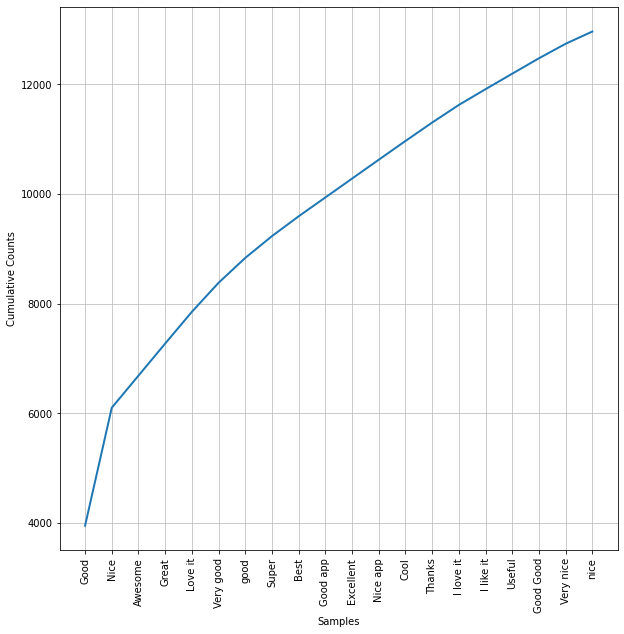

<AxesSubplot:xlabel='Samples', ylabel='Cumulative Counts'>

In [75]:
#plotting the 20 most words
data_analysis = nltk.FreqDist(filter_words)
plt.figure(figsize=(10,10))
data_analysis.plot(20, cumulative=True)

In [84]:
#Top 20 bi-gram from the reviews.
tokens = nltk.word_tokenize(str(new_google_records['review']))
bigrm = nltk.bigrams(tokens)
freq_bg=nltk.FreqDist(bigrm)
print(freq_bg.most_common(20))
#print(*map(' '.join, bigrm), sep=', ')

[(('174423', 'ooh'), 1), (('ooh', '.'), 1), (('.', 'm.g'), 1), (('m.g', 'hffjn'), 1), (('hffjn', '174424'), 1), (('174424', 'Wire'), 1), (('Wire', 'strippers'), 1), (('strippers', 'Tool'), 1), (('Tool', '174425'), 1), (('174425', 'Done'), 1), (('Done', '174426'), 1), (('174426', 'For'), 1), (('For', 'an'), 1), (('an', 'older'), 1), (('older', 'version'), 1), (('version', '174427'), 1), (('174427', 'GPS'), 1), (('GPS', 'NOT'), 1), (('NOT', 'LOCTOIN'), 1), (('LOCTOIN', 'HELP'), 1)]


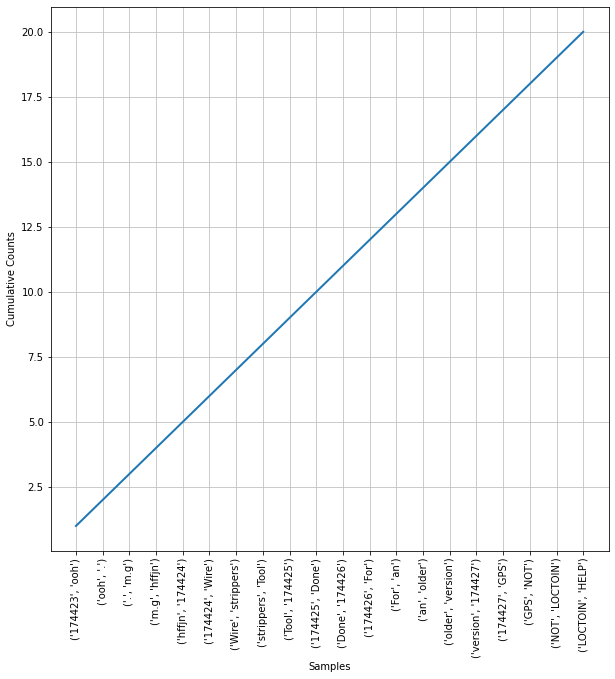

<AxesSubplot:xlabel='Samples', ylabel='Cumulative Counts'>

In [85]:
#plotting the 20 most-frequently occured bigram.
plt.figure(figsize=(10,10))
freq_bg.plot(20, cumulative=10)

#### Text cleaning and visualization.

In [88]:
import string
def remove_punctuations(text):
    for char in string.punctuation:
        text = text.replace(char, '')
    return text

new_google_records['review'] = new_google_records['review'].str.lower()
new_google_records['review'] = new_google_records['review'].apply(remove_punctuations)
new_google_records['review'] = new_google_records['review'].apply(lambda x: ' '.join([word for word in x.split() if word not in stopwords.words('english')]))
new_google_records['review']=new_google_records['review'].astype(str).apply(lambda x: x.encode('ascii', 'ignore').decode('ascii'))

C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys
C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Vivek\anaconda3\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.py

In [90]:
data_analysis = nltk.FreqDist(new_google_records['review'])
# Let's take the specific words only if their frequency is greater than 3.
filter_words = dict([(m, n) for m, n in data_analysis.items() if len(m) > 3])
for key in sorted(filter_words):
    print('--------------------'*2)
    print("%s: %s" % (key, filter_words[key]))
data_analysis = nltk.FreqDist(filter_words)

----------------------------------------
         : 1
----------------------------------------
                                                            mohammadtalai                                                : 2
----------------------------------------
                           b: 1
----------------------------------------
                clash royal: 1
----------------------------------------
                tanku google: 1
----------------------------------------
             arminesi   huawei g700: 1
----------------------------------------
             like: 1
----------------------------------------
             playstore  hangout  youtube: 1
----------------------------------------
             xxx: 1
----------------------------------------
            hhh: 1
----------------------------------------
          sedaibaran50  : 1
----------------------------------------
         gts7272   : 1
----------------------------------------
         maryam: 1
---------------------

addective helps everyone: 1
----------------------------------------
addicated game: 1
----------------------------------------
addict many often directed make votes casting couch: 1
----------------------------------------
addicted consume time: 1
----------------------------------------
addictive: 2
----------------------------------------
addictive fun: 1
----------------------------------------
addictive good app addictive: 1
----------------------------------------
addictive gosh favourite game: 1
----------------------------------------
addie good: 1
----------------------------------------
addipolli: 1
----------------------------------------
additional services enjoy: 1
----------------------------------------
addresses needs satisfaction guarantees services delivered system provide needs consumers daily lives: 1
----------------------------------------
adds: 1
----------------------------------------
adds memory nothing offline: 2
----------------------------------------
addsa

amaze biiiii: 1
----------------------------------------
amaze craze love fullest patch extra bugs tho: 1
----------------------------------------
amazeballs: 2
----------------------------------------
amazed: 3
----------------------------------------
amazed fast n useful: 1
----------------------------------------
amazed found geo cach: 1
----------------------------------------
amazig app really helpful phone: 1
----------------------------------------
amazin: 1
----------------------------------------
amazin works well: 1
----------------------------------------
amazing: 312
----------------------------------------
amazing : 4
----------------------------------------
amazing advanced: 1
----------------------------------------
amazing always something challenging: 1
----------------------------------------
amazing amazing: 8
----------------------------------------
amazing amazing loved: 1
----------------------------------------
amazing amazing really good: 1
---------------------

app easy enjoying: 1
----------------------------------------
app easy hack devices: 1
----------------------------------------
app easy use: 3
----------------------------------------
app easy use great service: 1
----------------------------------------
app easy use useful: 1
----------------------------------------
app eats storage: 1
----------------------------------------
app enhance gaming experience actually fill ram games wont load games worked fine disabling think way vulnerability phone: 2
----------------------------------------
app error: 1
----------------------------------------
app even weeks: 1
----------------------------------------
app ever late version: 1
----------------------------------------
app everything apps required: 1
----------------------------------------
app everything waiting app get beer fridge wo getting hahah picking googlegoogle play shizzit lmao: 1
----------------------------------------
app ex: 1
----------------------------------------
app exc

ashrab ali: 1
----------------------------------------
ashraf ali ashraf ali: 1
----------------------------------------
ashraf love: 1
----------------------------------------
ashrafhussain822gmail: 1
----------------------------------------
ashrafurrahman: 1
----------------------------------------
ashs ashs: 1
----------------------------------------
ashu: 4
----------------------------------------
ashu ashi: 1
----------------------------------------
ashu like: 1
----------------------------------------
ashutosh mishra news ripotar   : 1
----------------------------------------
ashvin parmar: 1
----------------------------------------
ashwani: 1
----------------------------------------
ashwani yadav: 1
----------------------------------------
ashwin choudhary: 1
----------------------------------------
ashwin mast: 1
----------------------------------------
asia abdi: 1
----------------------------------------
asif: 1
----------------------------------------
asif 12345: 1
---------

b ann funny bunny tiger funny fun loves jesus forever: 1
----------------------------------------
b b j j: 1
----------------------------------------
b b parmar: 1
----------------------------------------
b bang: 1
----------------------------------------
b chwal: 1
----------------------------------------
b e r drains phones battery fast please fix: 1
----------------------------------------
b good: 2
----------------------------------------
b gooooood hot: 3
----------------------------------------
b k yadav: 1
----------------------------------------
b love: 1
----------------------------------------
b love god: 1
----------------------------------------
b nice: 1
----------------------------------------
b nice app: 1
----------------------------------------
b p ok ok: 1
----------------------------------------
b pink: 1
----------------------------------------
b srikalahastieswarudu ready reckoner day day details: 1
----------------------------------------
b still: 1
--------------

----------------------------------------
baught phone cash crusader want donw loading everything: 1
----------------------------------------
bavita anjani: 1
----------------------------------------
bawa active: 1
----------------------------------------
bawde: 1
----------------------------------------
bay aha huli ka na update dinkta: 1
----------------------------------------
bay dan ms: 1
----------------------------------------
bay play google play: 1
----------------------------------------
bayaro2341: 1
----------------------------------------
bayas vice alam mo vice fan mo talaga ako pero naiinis ako kasi tanong kau ng tanong kay may eh anu kung crush nya c edward kay edward nga feelings masmalalim mo ung nararamdaman ni ed kaysa kay maymay gusto nya kasi c k ung ka love team ni edkainis c k ren parang walang alam nd nyo tinanung ung inggit c k kay may meron talaga yan insecure kay mayang sayang hanga panaman ako sau: 2
----------------------------------------
bayer best good: 

better good: 2
----------------------------------------
better google play contain playpause option downloading apps: 1
----------------------------------------
better google play store failed update: 1
----------------------------------------
better got nice ups help phone ez use: 1
----------------------------------------
better great: 1
----------------------------------------
better hhhhh: 1
----------------------------------------
better improved nice working: 1
----------------------------------------
better ios: 1
----------------------------------------
better itunes thats 4 sure: 1
----------------------------------------
better keep: 1
----------------------------------------
better l like: 1
----------------------------------------
better last time useful last time: 1
----------------------------------------
better like using: 1
----------------------------------------
better loved: 1
----------------------------------------
better lovely anyone andriod set: 1
--------------

----------------------------------------
brilliant service: 1
----------------------------------------
brilliant thanks: 1
----------------------------------------
brilliant thanks first time morning evening: 1
----------------------------------------
brilliant tried yet also try: 1
----------------------------------------
brilliant useful: 1
----------------------------------------
brilliantl butnot first party: 1
----------------------------------------
brilliantly: 1
----------------------------------------
brillient thing: 1
----------------------------------------
bring aap: 1
----------------------------------------
brings back sms erroneously deleted: 1
----------------------------------------
brings security phone: 1
----------------------------------------
brit okay: 1
----------------------------------------
brithday girl nice day: 2
----------------------------------------
brithe: 1
----------------------------------------
british: 1
----------------------------------------


cheap cheap: 1
----------------------------------------
cheap poor app: 1
----------------------------------------
cheap updates: 1
----------------------------------------
cheap yes good duh cheappp whahahhaha im american guysss bleahhh: 1
----------------------------------------
cheaters ghana movie: 1
----------------------------------------
cheating apps: 1
----------------------------------------
cheating cheating cannot deny one play game google play service updated: 1
----------------------------------------
cheats goole r developers act soeatch time load service say errorand doreen load consumer hell lot net chests: 2
----------------------------------------
check: 3
----------------------------------------
check 0: 1
----------------------------------------
check latest versions: 1
----------------------------------------
check n inform: 1
----------------------------------------
check software: 1
----------------------------------------
checking hmmmm used yet bt hope gonna c

cool love: 12
----------------------------------------
cool love app download apps want sometimes log still love: 1
----------------------------------------
cool love app makes life easier wish free try: 1
----------------------------------------
cool love candy: 1
----------------------------------------
cool love google ever: 1
----------------------------------------
cool love high accuracy: 1
----------------------------------------
cool love it: 1
----------------------------------------
cool love ly: 1
----------------------------------------
cool loved: 2
----------------------------------------
cool loved app: 1
----------------------------------------
cool mais comment activer les donnes arrire plan de google play storesvp rpondez vite cest urgent: 1
----------------------------------------
cool makes things easy: 1
----------------------------------------
cool man: 2
----------------------------------------
cool man like dud: 1
----------------------------------------
cool me

----------------------------------------
device stops working irritate annoying bug notification repeatedly update play service kitkat 442 android version many app requires updated play service fed: 1
----------------------------------------
devices: 2
----------------------------------------
devices us: 1
----------------------------------------
devil chinmay nice one: 1
----------------------------------------
devin like little: 1
----------------------------------------
devloper sir good useful app takes much place storage: 1
----------------------------------------
devs would googledo without: 1
----------------------------------------
devyada: 1
----------------------------------------
dewansh: 1
----------------------------------------
dewanshi maurya ambedkar: 1
----------------------------------------
df cant download app: 1
----------------------------------------
dfdd: 1
----------------------------------------
dfffff: 1
----------------------------------------
dg aliahmed: 1

----------------------------------------
dosint work: 1
----------------------------------------
dosnt open: 1
----------------------------------------
dost: 1
----------------------------------------
dost dashtan: 1
----------------------------------------
dost download pe: 1
----------------------------------------
dost thanks: 1
----------------------------------------
dosty iove: 1
----------------------------------------
dotere useful app thank: 1
----------------------------------------
dotering: 1
----------------------------------------
dots game loved: 1
----------------------------------------
double getting interesting daily: 1
----------------------------------------
doubt app links company beholds todays virtual world hands: 1
----------------------------------------
douggy cool: 1
----------------------------------------
douglas: 1
----------------------------------------
douglas service good thousands people use: 1
----------------------------------------
douneload googl

----------------------------------------
ehh whatever: 1
----------------------------------------
ehhh: 1
----------------------------------------
ehhh like change settings hate update use apps: 1
----------------------------------------
ehhh memory eating sucktastic app: 1
----------------------------------------
ehhhh made yeah great app really helps thingslt3: 1
----------------------------------------
ehhhh really sorry kinda glitchy: 2
----------------------------------------
ehhhlickmooth: 1
----------------------------------------
ehits ok absolute crap: 1
----------------------------------------
ehlay ehlay: 1
----------------------------------------
ehtshamjutt: 1
----------------------------------------
eid mubarak excellent: 1
----------------------------------------
eight wonder world faster n reliable working happy existing: 1
----------------------------------------
eisa love: 1
----------------------------------------
either app lollipop wont allow move apps sd card alwa

extremely helpful cant anything without it: 1
----------------------------------------
extremely important core system app whatever please dont deactivate dont disable dont clear cache isnt draining battery facebook app messenger app keeping location services app required smooth running android device even youve disabled inbuilt google apps almost app processes services dependent way yes uses around 260mb internal storage indispensable functions justifies: 1
----------------------------------------
extremely useful: 1
----------------------------------------
extremely useless: 1
----------------------------------------
exvellent: 1
----------------------------------------
exxilents wow nice: 1
----------------------------------------
eyasa iya: 1
----------------------------------------
eye eye home: 1
----------------------------------------
eyes eyes: 1
----------------------------------------
eyk yvo: 1
----------------------------------------
eyoub: 1
------------------------------

----------------------------------------
food loven: 1
----------------------------------------
food luck love: 1
----------------------------------------
food nice: 1
----------------------------------------
food nutrition: 1
----------------------------------------
foods: 1
----------------------------------------
foogle varmas: 1
----------------------------------------
fool app: 1
----------------------------------------
fool dump trash hahahha wish: 1
----------------------------------------
fool f: 1
----------------------------------------
foolish: 3
----------------------------------------
foolish app: 1
----------------------------------------
foolish app hate u: 1
----------------------------------------
foolish rubbish: 1
----------------------------------------
foolish thing update: 2
----------------------------------------
fools foolish: 1
----------------------------------------
fools make cool: 1
----------------------------------------
foon: 1
-------------------------

----------------------------------------
ghj bjj: 1
----------------------------------------
ghjk: 1
----------------------------------------
ghki: 1
----------------------------------------
ghkk: 1
----------------------------------------
ghnta app h: 1
----------------------------------------
ghongde: 1
----------------------------------------
ghoo ghoo: 1
----------------------------------------
ghorar dim many app need app run: 1
----------------------------------------
ghosh: 1
----------------------------------------
ghosh fine: 2
----------------------------------------
ghosh ghosh: 1
----------------------------------------
ghosh good: 1
----------------------------------------
ghost ft hf dry drug cyber: 1
----------------------------------------
ghost goo: 1
----------------------------------------
ghuhh huuuh: 1
----------------------------------------
ghui: 1
----------------------------------------
ghulamqadir chandii: 1
----------------------------------------
ghvj super:

good bad netflix greatest worst like showbox better movies tv shows: 1
----------------------------------------
good bad still work fine device wont let device updating apps: 1
----------------------------------------
good bad system good overall notifications trash said needed update went said google play services wont run unless update google play services suppose update: 1
----------------------------------------
good bad think helpful like hungry doesnt taste grab eat: 1
----------------------------------------
good badhiya: 1
----------------------------------------
good bahut achi nahi lagi kyunki hum se update nahi ho rahi: 1
----------------------------------------
good balance: 1
----------------------------------------
good bangladash: 1
----------------------------------------
good bast: 1
----------------------------------------
good basta good: 1
----------------------------------------
good batter: 3
----------------------------------------
good battery killed: 1
--------

good night sorry google tim: 1
----------------------------------------
good nis: 1
----------------------------------------
good nise: 2
----------------------------------------
good nistha: 1
----------------------------------------
good nizz: 1
----------------------------------------
good nj: 1
----------------------------------------
good no1app: 1
----------------------------------------
good non coment: 1
----------------------------------------
good none: 1
----------------------------------------
good normal use: 1
----------------------------------------
good notgood: 1
----------------------------------------
good nothing: 6
----------------------------------------
good nothing new: 1
----------------------------------------
good nothing say: 1
----------------------------------------
good nothing say convenient: 1
----------------------------------------
good ntng say: 1
----------------------------------------
good nyc: 2
----------------------------------------
good nyc a

----------------------------------------
google assistant work google also: 1
----------------------------------------
google assistant working: 1
----------------------------------------
google awesome: 6
----------------------------------------
google awesome love everything: 1
----------------------------------------
google back luving: 1
----------------------------------------
google bad: 2
----------------------------------------
google beautiful: 1
----------------------------------------
google beautifully: 1
----------------------------------------
google become appsshole tf need updated every time cant make something stable long time: 1
----------------------------------------
google becoming another microsoft: 1
----------------------------------------
google best: 20
----------------------------------------
google best : 1
----------------------------------------
google best app: 1
----------------------------------------
google best app ever: 1
----------------------------

google play store bad takes another world comes browse requires much expected: 1
----------------------------------------
google play store best: 1
----------------------------------------
google play store best app ever seen: 1
----------------------------------------
google play store best thing happened android: 1
----------------------------------------
google play store better: 1
----------------------------------------
google play store better like: 1
----------------------------------------
google play store boring: 1
----------------------------------------
google play store boring comes downloading: 1
----------------------------------------
google play store cant download update: 2
----------------------------------------
google play store didnt download: 1
----------------------------------------
google play store doesnt work cant update apps phone: 1
----------------------------------------
google play store download: 1
----------------------------------------
google play s

great game game grew play: 1
----------------------------------------
great game get 5 logging facebook advertised get 2 sometimes watch clip coins dont get also cant send gifts friends youve added facebook friends: 1
----------------------------------------
great game happy game: 1
----------------------------------------
great game im enjoy games: 1
----------------------------------------
great game like tv show: 1
----------------------------------------
great games: 2
----------------------------------------
great games takes much space: 1
----------------------------------------
great get app want: 2
----------------------------------------
great get games music stuff love: 1
----------------------------------------
great ghhjff: 1
----------------------------------------
great gift: 1
----------------------------------------
great giid: 1
----------------------------------------
great gives better access apps: 1
----------------------------------------
great go back time: 1
----

----------------------------------------
happy ako thanks apps: 1
----------------------------------------
happy also: 1
----------------------------------------
happy always: 1
----------------------------------------
happy always top things im happy thanks: 1
----------------------------------------
happy app: 2
----------------------------------------
happy becouse cant update even space: 1
----------------------------------------
happy befhday mom: 1
----------------------------------------
happy browser using love using app gives best: 1
----------------------------------------
happy bus: 1
----------------------------------------
happy cababtoan: 1
----------------------------------------
happy cheers: 1
----------------------------------------
happy day: 2
----------------------------------------
happy dec nice app: 1
----------------------------------------
happy doribal: 1
----------------------------------------
happy download thing: 1
----------------------------------------

----------------------------------------
help full play games like clash clan: 1
----------------------------------------
help full usefull: 1
----------------------------------------
help fulll: 1
----------------------------------------
help fully: 1
----------------------------------------
help game: 1
----------------------------------------
help game play app nees: 1
----------------------------------------
help game safe gaurd game account gmail: 1
----------------------------------------
help games: 1
----------------------------------------
help gogle play servise: 1
----------------------------------------
help guys every time l install version google play stops immediately: 1
----------------------------------------
help happy: 1
----------------------------------------
help help: 1
----------------------------------------
help help menot enough space: 1
----------------------------------------
help helped alot n games r always backed: 1
--------------------------------------

hoooooo: 1
----------------------------------------
hoorey happy: 1
----------------------------------------
hop lop: 1
----------------------------------------
hope: 2
----------------------------------------
hope app good enjoy: 1
----------------------------------------
hope apps load apps: 1
----------------------------------------
hope errors sync: 1
----------------------------------------
hope everything gona okey coz close friend abt talaeasy way get loan faster grown limit: 1
----------------------------------------
hope faster download apps: 2
----------------------------------------
hope helps thanks: 1
----------------------------------------
hope holley hope: 1
----------------------------------------
hope keeps upgrading: 1
----------------------------------------
hope next version: 1
----------------------------------------
hope update app: 1
----------------------------------------
hope work: 2
----------------------------------------
hope works: 2
---------------------

india good country love india: 1
----------------------------------------
india jai ho: 1
----------------------------------------
india lived: 1
----------------------------------------
india8 up8: 1
----------------------------------------
indian: 1
----------------------------------------
indian bangla sex video: 1
----------------------------------------
indian forced save everything: 1
----------------------------------------
indias best app: 1
----------------------------------------
indiasix: 1
----------------------------------------
individual lyfy: 1
----------------------------------------
indonesia: 1
----------------------------------------
indore hi friends: 1
----------------------------------------
indra: 1
----------------------------------------
indra prakash old version: 1
----------------------------------------
indrajeet: 1
----------------------------------------
indrajit happy: 1
----------------------------------------
indrajith nice cool: 1
--------------------

----------------------------------------
jhoy navarro88: 1
----------------------------------------
jhumon: 1
----------------------------------------
jhzh box: 1
----------------------------------------
ji boss jordar: 1
----------------------------------------
ji good: 1
----------------------------------------
ji kemonasen: 1
----------------------------------------
ji skilled electronics engineer thanks: 1
----------------------------------------
jibon ashik: 1
----------------------------------------
jibonkhan jibon8888: 1
----------------------------------------
jibonniswas: 1
----------------------------------------
jicy joc: 1
----------------------------------------
jie nice: 1
----------------------------------------
jieronjie coc: 1
----------------------------------------
jiganesh bhavesh: 1
----------------------------------------
jigar: 1
----------------------------------------
jigar g nri best: 1
----------------------------------------
jigar patel: 1
------------------

----------------------------------------
khalil behzad: 1
----------------------------------------
khalil bhat: 1
----------------------------------------
khalique cool: 1
----------------------------------------
khan: 11
----------------------------------------
khan armani: 1
----------------------------------------
khan boy: 1
----------------------------------------
khan famly: 1
----------------------------------------
khan good: 1
----------------------------------------
khan good working: 1
----------------------------------------
khan google play service best app google ever created provides smoothness apps phone lets device work smarter efficient: 1
----------------------------------------
khan imran: 1
----------------------------------------
khan jaan: 1
----------------------------------------
khan khan: 2
----------------------------------------
khan khann: 1
----------------------------------------
khan king rasheedb: 1
----------------------------------------
khan like: 1

lemot kenapa kok tempat ku upgret nya lemot banget: 1
----------------------------------------
lena need tell thing: 1
----------------------------------------
lena please need tell thing: 1
----------------------------------------
lenard villagracia: 1
----------------------------------------
lendugure: 1
----------------------------------------
lenova kide note5: 1
----------------------------------------
lenove tab3 7 keeps telling update google play services time update tells thing restarting complete waste time: 1
----------------------------------------
lenovo a889 stop working update: 2
----------------------------------------
lenovo update playing game: 1
----------------------------------------
lenovo vibe p1 version 50 shows update google play services notification bar give update shows uninstall: 1
----------------------------------------
lent: 1
----------------------------------------
leo sharing app delete sharing app: 1
----------------------------------------
leoangelo 

----------------------------------------
lo ko: 1
----------------------------------------
lo laah: 1
----------------------------------------
lo mejor buen desempeo en tu cell: 1
----------------------------------------
lo thu: 1
----------------------------------------
lo yu: 1
----------------------------------------
lo583333gmailcom sengmyitatstargmailcom: 1
----------------------------------------
load: 3
----------------------------------------
load 3: 1
----------------------------------------
load everything: 1
----------------------------------------
load rubbish every single app open except photos: 1
----------------------------------------
load rubbish phone says need update youtube go press update doesnt work load people made updates need update memories: 1
----------------------------------------
loaded simply love: 1
----------------------------------------
loadign: 1
----------------------------------------
loading: 5
----------------------------------------
loading apps

love liven tha music keep playen: 2
----------------------------------------
love lkkkk: 1
----------------------------------------
love lo: 2
----------------------------------------
love lo lo maan liya hamne: 1
----------------------------------------
love loads: 1
----------------------------------------
love lol: 1
----------------------------------------
love lol love awesome: 1
----------------------------------------
love looooooove: 1
----------------------------------------
love lot: 2
----------------------------------------
love lot : 1
----------------------------------------
love lot best app: 1
----------------------------------------
love love: 124
----------------------------------------
love love app: 10
----------------------------------------
love love app gave 5: 1
----------------------------------------
love love app useful: 1
----------------------------------------
love love app useful updates etc: 1
----------------------------------------
love love apps: 2
--

----------------------------------------
luan muaxheri: 1
----------------------------------------
luar biaso ok: 1
----------------------------------------
lub et reli reli lab bicoz uzefool: 1
----------------------------------------
lubaba: 1
----------------------------------------
lubosranieboy latina12: 1
----------------------------------------
luc luv: 1
----------------------------------------
lucas yo yo brother new style : 1
----------------------------------------
luccky useful app: 1
----------------------------------------
lucia mazive: 1
----------------------------------------
lucifer aka louis brilliant app help find looking liking app 100: 1
----------------------------------------
luck: 2
----------------------------------------
luck nut: 1
----------------------------------------
lucky: 6
----------------------------------------
lucky babani: 1
----------------------------------------
lucky best: 1
----------------------------------------
lucky boy 12345: 1
--------

mast bhai: 1
----------------------------------------
mast che: 1
----------------------------------------
mast cool: 1
----------------------------------------
mast dhasu: 1
----------------------------------------
mast good: 1
----------------------------------------
mast goof: 1
----------------------------------------
mast h: 3
----------------------------------------
mast hai: 10
----------------------------------------
mast hai baba: 1
----------------------------------------
mast hai bindass: 1
----------------------------------------
mast hai mast hai: 1
----------------------------------------
mast hai yaar paar plz ball phone ko support kr yaar: 1
----------------------------------------
mast hai yar useful: 1
----------------------------------------
mast hain bhai: 1
----------------------------------------
mast hair yar: 1
----------------------------------------
mast hii: 1
----------------------------------------
mast hsi: 1
----------------------------------------
mast j

----------------------------------------
mohdarshadali: 1
----------------------------------------
moheen: 1
----------------------------------------
mohim khandaker: 1
----------------------------------------
mohini singh beautyful: 1
----------------------------------------
mohit: 5
----------------------------------------
mohit kumar mohit kumar: 1
----------------------------------------
mohit mohit: 3
----------------------------------------
mohit sahani: 1
----------------------------------------
mohit sangma copper sword 2460: 1
----------------------------------------
mohitmaurya777: 1
----------------------------------------
mohmmad chand: 1
----------------------------------------
mohmmad shock caren: 1
----------------------------------------
mohommodmustupha: 1
----------------------------------------
mohona hints moheeuddin: 1
----------------------------------------
mohrwais mohrwais: 1
----------------------------------------
mohsan khan ali: 1
--------------------------

must update enjoy update play service enjoy clash clans accounts: 2
----------------------------------------
must update much: 1
----------------------------------------
must update run related apps: 1
----------------------------------------
must update timely: 1
----------------------------------------
must updated: 1
----------------------------------------
must updatehate told mustno wonder people sick people go iphone: 1
----------------------------------------
must use essential gaming online worlds: 1
----------------------------------------
must useful right work completly: 1
----------------------------------------
must usefull app: 1
----------------------------------------
mustafa cr7: 1
----------------------------------------
mustak ansari good app: 1
----------------------------------------
mustakeem: 1
----------------------------------------
mustakim: 1
----------------------------------------
mustapha ahmad mg mustapha ahmad mg: 1
--------------------------------------

never works: 1
----------------------------------------
never works find solution even help pages: 1
----------------------------------------
never works properly cant depend need: 1
----------------------------------------
never works right: 1
----------------------------------------
never works zte: 1
----------------------------------------
new 2 new: 1
----------------------------------------
new age beginnings humans high life started high apps high versions show technology give us new living: 1
----------------------------------------
new america films: 1
----------------------------------------
new androi new: 1
----------------------------------------
new android user app way easier use apples: 1
----------------------------------------
new app: 1
----------------------------------------
new app instilling new solffwere: 1
----------------------------------------
new apps: 1
----------------------------------------
new becomes exciting: 1
---------------------------------------

----------------------------------------
nice outlay easy read use love : 1
----------------------------------------
nice owsm app experience: 1
----------------------------------------
nice pakka app: 1
----------------------------------------
nice pandey: 1
----------------------------------------
nice penis: 1
----------------------------------------
nice perfect app: 1
----------------------------------------
nice perfect apps games: 1
----------------------------------------
nice performance: 1
----------------------------------------
nice performance good: 1
----------------------------------------
nice permission good: 2
----------------------------------------
nice phone: 1
----------------------------------------
nice pic: 2
----------------------------------------
nice picture: 1
----------------------------------------
nice play: 1
----------------------------------------
nice play app: 1
----------------------------------------
nice play games: 1
---------------------------

occupies huge space disgusting: 1
----------------------------------------
occupies large space: 1
----------------------------------------
occupies lot phone memory fills entire space: 1
----------------------------------------
occupies lot space: 1
----------------------------------------
occupies lot space tablet: 1
----------------------------------------
occupies memory bro: 1
----------------------------------------
occupies much space: 3
----------------------------------------
occupies much space every time clear data: 1
----------------------------------------
occupies much space internal memory: 1
----------------------------------------
occupies space: 1
----------------------------------------
occupies space 145 mb: 1
----------------------------------------
occupies space instal: 1
----------------------------------------
occupies space waste time: 1
----------------------------------------
occupy huge memory: 1
----------------------------------------
occupy large space d

----------------------------------------
oooooo: 2
----------------------------------------
oooooo boring: 1
----------------------------------------
oooooo interesting: 1
----------------------------------------
oooooo yeeeeeeerrrrrr: 1
----------------------------------------
oooooohhhhhhhh: 1
----------------------------------------
ooooooo: 1
----------------------------------------
oooooooo: 2
----------------------------------------
ooooooooo: 1
----------------------------------------
oooooooood: 1
----------------------------------------
oooooooooommmmmmmm awesome: 1
----------------------------------------
oooooooooooooooo: 2
----------------------------------------
oooooooooooooooooooooooo: 1
----------------------------------------
ooooooooooooooooooopppppppppppppppppppppppppppssssssssssssssssssssss: 1
----------------------------------------
ooooooooowondr full apk easy use: 1
----------------------------------------
oooooowww iloved: 1
-------------------------------------

plans vs zombie: 1
----------------------------------------
plants vs zombies ang hirap nya laruin lalo nat walang araw: 1
----------------------------------------
plants vs zombies log update: 1
----------------------------------------
platform variety apps one place love: 2
----------------------------------------
platformin game: 1
----------------------------------------
play: 14
----------------------------------------
play aaaaaaaaccvccchhhhhhaaaaaaaa: 1
----------------------------------------
play app good: 1
----------------------------------------
play app later version: 1
----------------------------------------
play app love becuas helps get apps: 1
----------------------------------------
play books wont run unless update takes many minutes: 1
----------------------------------------
play boy liked: 1
----------------------------------------
play cant update gives constant error message annoying: 1
----------------------------------------
play coc: 1
----------------------

----------------------------------------
pranav: 1
----------------------------------------
pranav google: 1
----------------------------------------
pranav ok app: 1
----------------------------------------
prancu mishra good app: 1
----------------------------------------
praneesh kp: 1
----------------------------------------
pranil dargude: 1
----------------------------------------
pranit patil: 1
----------------------------------------
pranjal love: 1
----------------------------------------
pranjal medhi p: 1
----------------------------------------
pranju loved: 1
----------------------------------------
prarthana everything life: 1
----------------------------------------
prasad: 1
----------------------------------------
prasad divya prasad divya: 1
----------------------------------------
prasad sc: 2
----------------------------------------
prasad uuuuuuu: 1
----------------------------------------
prasanna good: 1
----------------------------------------
prasanna samal: 1

rakesh kumar delhi rakesh kumar delhi: 2
----------------------------------------
rakesh kumar kumar rajvir: 1
----------------------------------------
rakesh kumar manish kumar: 1
----------------------------------------
rakesh kumar rakesh kumar 19 97 2017 rakesh kumar: 1
----------------------------------------
rakesh kumar useful app: 1
----------------------------------------
rakesh machi rakesh machi: 1
----------------------------------------
rakesh madia: 1
----------------------------------------
rakesh mohaniya: 1
----------------------------------------
rakesh rakesh: 4
----------------------------------------
rakesh saini: 1
----------------------------------------
rakeshkumar rakeshkumar: 1
----------------------------------------
rakia good: 1
----------------------------------------
rakib: 1
----------------------------------------
rakib good: 1
----------------------------------------
rakib nice: 1
----------------------------------------
rakib rahman rakibhossain321321

----------------------------------------
required much space makes work easier: 1
----------------------------------------
required really app requirement google apps run device: 1
----------------------------------------
required really get older version makes google items useless really bug needs fixedfast: 1
----------------------------------------
required run system properly: 1
----------------------------------------
required running core functionalities applications though headache lower memmory devices: 1
----------------------------------------
required slow glitchy piece crap: 1
----------------------------------------
required update soon: 1
----------------------------------------
requirement: 1
----------------------------------------
requirement backup: 1
----------------------------------------
requires 150 mb: 1
----------------------------------------
requires continue updatesacquires phone memory: 1
----------------------------------------
requires damn space installa

sajid dahngal: 1
----------------------------------------
sajid khan: 1
----------------------------------------
sajid patni: 1
----------------------------------------
sajid sajid: 3
----------------------------------------
sajidkhan khan: 1
----------------------------------------
sajidulhamid: 1
----------------------------------------
sajith dilshan: 1
----------------------------------------
sajitjoj sajitjoj: 1
----------------------------------------
sajjad bhit: 1
----------------------------------------
sajjad sajjad: 1
----------------------------------------
sajjankumarmandal: 1
----------------------------------------
sak useful apps: 1
----------------------------------------
sakariye suhayab: 2
----------------------------------------
sake youtube update: 1
----------------------------------------
sakeel: 1
----------------------------------------
sakeel malik: 1
----------------------------------------
sakhalin hcfgnm: 1
----------------------------------------
sakiab ka

----------------------------------------
sh sh: 1
----------------------------------------
shaaipt: 2
----------------------------------------
shaba: 1
----------------------------------------
shabaz ali good appp: 1
----------------------------------------
shabaz khan: 1
----------------------------------------
shabbir: 1
----------------------------------------
shabby: 1
----------------------------------------
shabeenawab hamara piyaar duniya yaad karegi arqam shabeenanawab nawab mera kal hai miss family: 1
----------------------------------------
shabinakunnil mv: 1
----------------------------------------
shabir dar chinar drillers: 1
----------------------------------------
shabir hussain: 1
----------------------------------------
shabnam: 1
----------------------------------------
shabnam parveen sharfuddin: 1
----------------------------------------
shabuddin aatari: 1
----------------------------------------
shabuz shabuz: 1
----------------------------------------
shad: 1
--

----------------------------------------
slow phone memory loss: 1
----------------------------------------
slow phone speed: 2
----------------------------------------
slow phone speed lot memory used app: 1
----------------------------------------
slow play stor 2g net slow dont paus opportunity download somone call restart first thats android use love mobo market suparb app: 1
----------------------------------------
slow problem downloading: 1
----------------------------------------
slow process: 1
----------------------------------------
slow process please resolve issue: 1
----------------------------------------
slow process plzz change process: 1
----------------------------------------
slow response: 1
----------------------------------------
slow server even high speed data: 1
----------------------------------------
slow service: 1
----------------------------------------
slow service slow installing: 1
----------------------------------------
slow slow: 4
-----------------

storage want make storage installed: 1
----------------------------------------
storage waste: 1
----------------------------------------
storage west app: 1
----------------------------------------
storage worst thing cant use youtube: 1
----------------------------------------
store black blue: 1
----------------------------------------
store dont good persian applications: 1
----------------------------------------
stored previous activity: 1
----------------------------------------
storeg low lite mb: 1
----------------------------------------
storejust amazing bringing new staff: 1
----------------------------------------
stores sd card always stores ram: 1
----------------------------------------
storge large size installation plzz reduce app size: 1
----------------------------------------
story biography: 1
----------------------------------------
story completely: 1
----------------------------------------
story edit jishan: 1
----------------------------------------
story l c

superrr: 4
----------------------------------------
superrr easy: 1
----------------------------------------
superrr nice: 1
----------------------------------------
superrrb apps loving: 1
----------------------------------------
superrrr: 4
----------------------------------------
superrrr good: 1
----------------------------------------
superrrrr: 1
----------------------------------------
superrrrr super: 1
----------------------------------------
superrrrrr: 2
----------------------------------------
superrrrrr love: 1
----------------------------------------
superrrrrrr: 1
----------------------------------------
superrrrrrrbbbbb: 1
----------------------------------------
superrrrrrrr: 1
----------------------------------------
superrrrrrrr best: 1
----------------------------------------
superrrrrrrrrr: 2
----------------------------------------
supersell: 1
----------------------------------------
superstar: 1
----------------------------------------
superve: 1
---------------

tells u update else tube goes bye bye boring: 1
----------------------------------------
tells update google play services stops still cant use google : 1
----------------------------------------
tells update last version update possible wtf: 1
----------------------------------------
tells update wont weeks really irritating: 1
----------------------------------------
tells us apps appropriate phone love: 1
----------------------------------------
tells us delete apps create space update google play services bt u delete apps still space nt created apps deleted: 1
----------------------------------------
tem gilbert: 1
----------------------------------------
temitope bolaji: 1
----------------------------------------
temmy nice one: 1
----------------------------------------
temple run: 2
----------------------------------------
temporary error occurred get opening android jb google making compulsory download low space delete updates youre good go cant find app store update needed rev

----------------------------------------
thnks: 9
----------------------------------------
thnks thnks siri love: 1
----------------------------------------
thnku: 1
----------------------------------------
thns: 1
----------------------------------------
thnx: 6
----------------------------------------
thnx google nic app use youtube play games etc thnku guys much: 1
----------------------------------------
thnx great: 1
----------------------------------------
thnx helpful app: 1
----------------------------------------
thnx helping play games easier: 1
----------------------------------------
thnx jst: 1
----------------------------------------
thnx team: 1
----------------------------------------
thnx used ful: 1
----------------------------------------
thobisa love guys get: 1
----------------------------------------
thom thom: 1
----------------------------------------
thook chi dont like: 1
----------------------------------------
thoooooooooooo thoooooooooooo: 1
---------------

uesful: 2
----------------------------------------
uesfull find uesfull app: 1
----------------------------------------
ueue7w subsidies: 2
----------------------------------------
uf u: 1
----------------------------------------
ufcsport helf: 1
----------------------------------------
ufff: 1
----------------------------------------
ufff boring: 1
----------------------------------------
uffff: 1
----------------------------------------
ufja geuoff: 1
----------------------------------------
ufyuy: 1
----------------------------------------
ug hf: 1
----------------------------------------
ugam ugam: 1
----------------------------------------
uganda: 1
----------------------------------------
ugg broke youtube: 1
----------------------------------------
ugh : 1
----------------------------------------
ugh accidentally ininstalled even thought literally uninstalled everything could still aparently insufficient storage need things usually phone cant stay sane without im going lovely we

----------------------------------------
use full use full games clash clans: 1
----------------------------------------
use full useful versions amazing: 1
----------------------------------------
use full usefull download app without app connot download app: 1
----------------------------------------
use full usefull helps search: 1
----------------------------------------
use full waste storing phone draining battery plz repair app: 1
----------------------------------------
use fully app: 1
----------------------------------------
use fully phone good working app iloved app : 1
----------------------------------------
use good: 4
----------------------------------------
use good use: 1
----------------------------------------
use google everyday: 1
----------------------------------------
use google everyday would want without one favorites: 1
----------------------------------------
use google play app manager phone co settings agreements sure terms apps including phone: 1
-------

utkarsh: 1
----------------------------------------
utkarsh update please: 1
----------------------------------------
utkarsh yadav love app: 1
----------------------------------------
utpal barman: 1
----------------------------------------
uts ok ok: 1
----------------------------------------
utsabsinhagmailcom utsabsinha: 1
----------------------------------------
uttam: 1
----------------------------------------
uttam nagar rc hotel: 1
----------------------------------------
uttam sahani: 1
----------------------------------------
uttamkumar singh: 1
----------------------------------------
utter trash: 1
----------------------------------------
utterly ridiculously useless app useless day message able new year bit information contained herein sure weeks new york city message weeks new york new one email email last app meaningless story: 1
----------------------------------------
utub: 2
----------------------------------------
utube: 2
----------------------------------------
utu

----------------------------------------
want watching leaning app: 1
----------------------------------------
want wifi net work connection: 1
----------------------------------------
want work: 1
----------------------------------------
want youtube without updating: 1
----------------------------------------
want youtube work im real: 1
----------------------------------------
wanted: 1
----------------------------------------
wanted access every bit information phone deleted 2400 photos didnt want update: 1
----------------------------------------
wanted cos everything runs yeah: 1
----------------------------------------
wanted google play service: 1
----------------------------------------
wanted look youtube video: 1
----------------------------------------
wanted say u reaynneed sc: 1
----------------------------------------
wanted using watsupp use: 1
----------------------------------------
wants good service: 1
----------------------------------------
wants many permissions 

wont rate app high use time: 1
----------------------------------------
wont recognize kodibox wont recognize a96z kodibox: 1
----------------------------------------
wont run perfectly: 1
----------------------------------------
wont run unless update cant update great frustrating: 1
----------------------------------------
wont run vl103: 1
----------------------------------------
wont stop telling space update although 15 times space needs cant run antything without horrible: 1
----------------------------------------
wont update: 26
----------------------------------------
wont update : 2
----------------------------------------
wont update 2gig spacegetting really sick google: 1
----------------------------------------
wont update 300mb phone keeps saying insufficient storage cant use tubei hope something: 1
----------------------------------------
wont update android 60 reach 100 stay finish installing way fix: 1
----------------------------------------
wont update app wont updat

xxxmovies love: 1
----------------------------------------
xxxvidos: 1
----------------------------------------
xxxwww xxxwws: 1
----------------------------------------
xxxx: 3
----------------------------------------
xxxx vdio: 1
----------------------------------------
xxxx vido: 2
----------------------------------------
xxxx x: 1
----------------------------------------
xxxx xxxxxx xxxxx: 1
----------------------------------------
xxxxv: 1
----------------------------------------
xxxxxhotxxxx free data: 1
----------------------------------------
xxxxxx: 1
----------------------------------------
xxxxxx xxxxxx: 1
----------------------------------------
xxxxxxxx xxxxxxxx: 1
----------------------------------------
xxxxxxxxxxxxxxxxxxxxxx: 1
----------------------------------------
xxxxy: 1
----------------------------------------
xxxy: 1
----------------------------------------
xyddf: 1
----------------------------------------
xyllenejanecly24 antoninomabansag: 1
-------------------

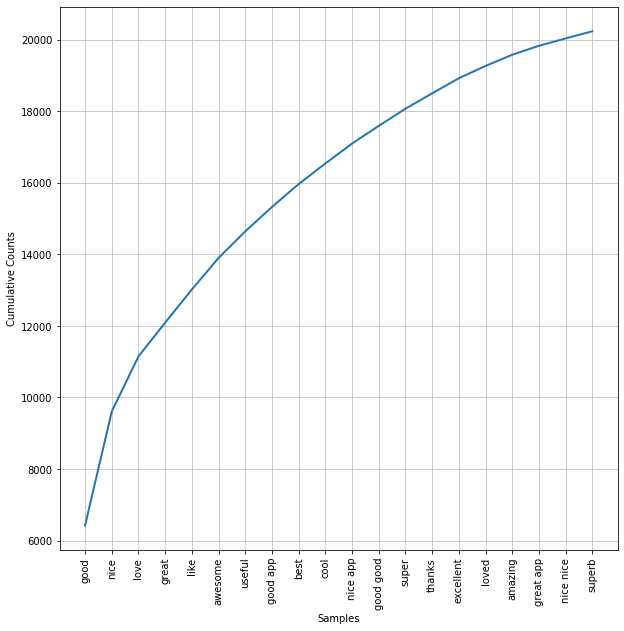

<AxesSubplot:xlabel='Samples', ylabel='Cumulative Counts'>

In [91]:
#plotting the 20 most words
plt.figure(figsize=(10,10))
data_analysis.plot(20, cumulative=True)

[(('174423', 'ooh'), 1), (('ooh', 'mg'), 1), (('mg', 'hffjn'), 1), (('hffjn', '174424'), 1), (('174424', 'wire'), 1), (('wire', 'strippers'), 1), (('strippers', 'tool'), 1), (('tool', '174425'), 1), (('174425', 'done'), 1), (('done', '174426'), 1), (('174426', 'older'), 1), (('older', 'version'), 1), (('version', '174427'), 1), (('174427', 'gps'), 1), (('gps', 'loctoin'), 1), (('loctoin', 'help'), 1), (('help', 'ples'), 1), (('ples', '...'), 1), (('...', '277953'), 1), (('277953', 'nice'), 1)]


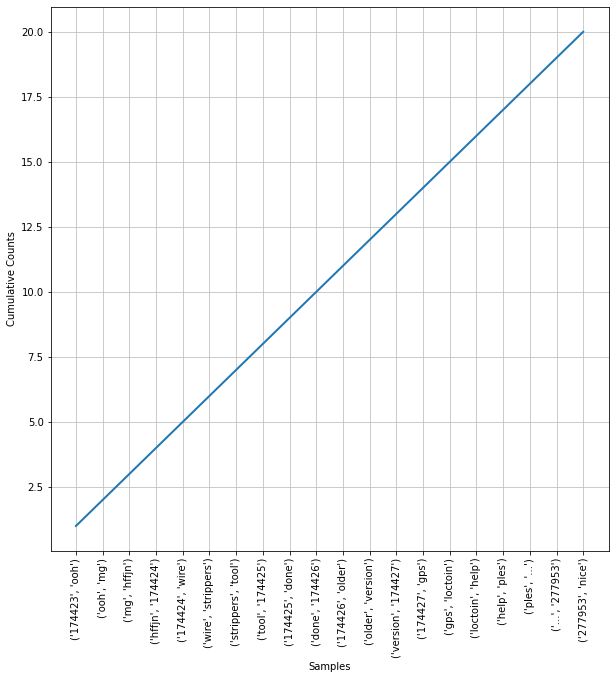

<AxesSubplot:xlabel='Samples', ylabel='Cumulative Counts'>

In [92]:
tokens = nltk.word_tokenize(str(new_google_records['review']))
bigrm = nltk.bigrams(tokens)
freq_bg=nltk.FreqDist(bigrm)
print(freq_bg.most_common(20))
plt.figure(figsize=(10,10))
freq_bg.plot(20, cumulative=10) #plotting the 20 most common bigram.

### Category approach for ratings and review

As we've seen that, most of the ratings for google's GMS apps are between 4 to 5, where we could only compare reviews between 5 stars and 1 star, that would leave out the reviews from 1-4 stars. <br> <br>Instead, let’s consolidate the ratings to either high or low.

In [196]:
new_google_records['star'] = new_google_records['star'].replace(
               {1:'Low Rating', 2:'Low Rating', 3:'Low Rating',
                4:'High Rating', 5:'High Rating'})
corpus = st.CorpusFromPandas(new_google_records,
                             category_col='star',
                             text_col='review',
                             nlp=nlp).build()

- It is nice to create a table in data science for word and count visualization, but let's try visualizing the words between low to high ratings with respect to google's GMS app.<br> <br>
#### Pros: <br>
-  With this Scattertext plot, we can easily search for words that may be useful for knowing about the application. 
<br>
- Not only can we see if a term is more closely associated with a positive or negative rating, but we can also read each individual review.


In [211]:
from scattertext import SampleCorpora, PhraseMachinePhrases, dense_rank, RankDifference, AssociationCompactor, produce_scattertext_explorer
html = produce_scattertext_explorer(
    corpus,
    category='Low Rating',
    category_name='Low Rating', not_category_name='High Rating',
                   width_in_pixels=1000)

- Saving it as HTML file for clear visualization and also for sharing, which allows flexibility.

In [212]:
html_file_name = "test.html"
open(html_file_name, 'wb').write(html.encode('utf-8'))

3838574